# Projet 6 | Classifiez automatiquement des biens de consommation
###### --------------------------------------------------------------------------------------------------------------------------------------------------------------

# Problématique

Etudier la faisabilité d'un moteur de classification des articles en différentes catégories, basé sur une image et une description, et avec un niveau de précision suffisant, pour l'automatisation de l'attribution de la catégorie des articles. 

# Objectifs

- Etudier la faisabilité d'un moteur de classification des articles en différentes catégories, avec un niveau de précision suffisant. 
- analyser le jeu de données en réalisant un prétraitement des descriptions des produits et des images
- realiser une réduction de dimension
-  clustering.

In [98]:
#pip install opencv-python==4.5.1.48

In [99]:
#%reset -f

In [100]:
#import os
#os.environ["TF_KERAS"]='1'

In [101]:
#!python -V

In [102]:
#%pip install nltk

In [103]:
#%pip install tensorflow

In [104]:
#%pip install gensim

In [105]:
#%pip install transformers

In [106]:
#%pip install sacremoses

In [107]:
#%pip install tensorflow_hub

In [108]:
#%pip install tensorflow_text

In [109]:
#!pip install yellowbrick

In [110]:
#!pip list

## Import des packages

In [338]:
# Modules classiques d'analyse exploratoire:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import chart_studio as cs
import plotly.offline as po
import plotly.graph_objs as gobj
import re

# Mathématiques
import math

# Manipulation fichiers et Interaction avec l'os / notebook
import os
import csv
import requests
import warnings
import json
import autopep8

# Manipulation de chaines de caractères
from ast import literal_eval 
#abstract syntax tree
from bs4 import BeautifulSoup as soup


# Manipulations temporelles
import datetime as dt
from tqdm import tqdm
from tqdm.notebook import tqdm, trange
import time

# Extraction web
from urllib.request import urlopen as uReq # Web client
import urllib.request # Web client
from importlib_metadata import version

# Feature engineering
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler

# Modelling
from sklearn.cluster import KMeans

In [339]:
from sklearn.feature_extraction.text import CountVectorizer

In [340]:
# for NLP
import nltk
nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer
from nltk import word_tokenize
from nltk.corpus import stopwords


[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\yosra\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


## 1) Importation et découverte du jeu de données

In [566]:
# Chargement du jeu de données
products = pd.read_csv("flipkart_com-ecommerce_sample_1050.csv", sep=",")

In [567]:
products.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


Chaque ligne correspond à une produit, avec son nom et ses caractéristiques associées telle qu'une description, la catégorie du produit, la marque, une image etc...



In [568]:
products.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications'],
      dtype='object')

In [569]:
#decouvrir la taille de notre base de données
products.shape

(1050, 15)

Le jeu de données contient 1050 lignes et 15 colonnes.

In [570]:
products.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications'],
      dtype='object')

In [571]:
#decouvrir le type de chaque variable dans les colonnes
products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

In [572]:
#Description statistique
products.describe()

,retail_price,discounted_price
count,1049.000000,1049.000000
mean,2186.197331,1584.527169
std,7639.229411,7475.099680
min,35.000000,35.000000
25%,555.000000,340.000000
50%,999.000000,600.000000
75%,1999.000000,1199.000000
max,201000.000000,201000.000000


In [573]:
products.describe(include=[object])

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,image,description,product_rating,overall_rating,brand,product_specifications
count,1050,1050,1050,1050,1050,1050,1050,1050,1050,1050,712,1049
unique,1050,149,1050,1050,642,1050,1050,1050,27,27,490,984
top,55b85ea15a1536d46b7190ad6fff8ce7,2015-12-01 12:40:44 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Bed Linen >> Blankets, Qu...",CRNEG7BKMFFYHQ8Z,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,PRINT SHAPES,"{""product_specification""=>[{""key""=>""Type"", ""va..."
freq,1,150,1,1,56,1,1,1,889,889,11,22


### Observation :
- La colonne 'product_category_tree' contient des élements textuels qui permettront d'étudier la faisabilité de l'attribution automatique de la catégorie d'un article.

-  cette colonne contient les étiquettes finales auxquelles il faudra attribuer automatiquement les produits, sur base de leur description et d'une image.

- On va analyser les valeurs de cette colonne, mais pour cela on dois la traiter .

In [574]:
#decouvrir le type de variable dans les lignes
products.dtypes

uniq_id                     object
crawl_timestamp             object
product_url                 object
product_name                object
product_category_tree       object
pid                         object
retail_price               float64
discounted_price           float64
image                       object
is_FK_Advantage_product       bool
description                 object
product_rating              object
overall_rating              object
brand                       object
product_specifications      object
dtype: object

<AxesSubplot:ylabel='None'>

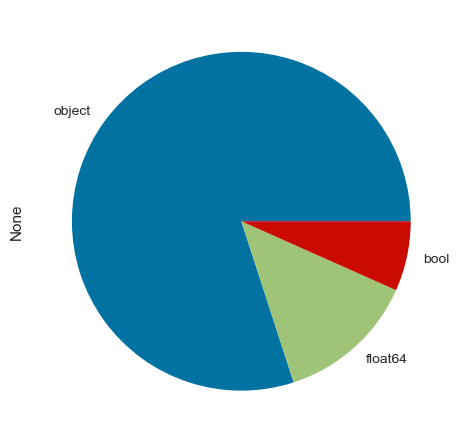

In [575]:
products.dtypes.value_counts().plot.pie()

In [576]:
products.isna().sum()

uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
product_category_tree        0
pid                          0
retail_price                 1
discounted_price             1
image                        0
is_FK_Advantage_product      0
description                  0
product_rating               0
overall_rating               0
brand                      338
product_specifications       1
dtype: int64

In [577]:
#Somme des variables manquantes
products.isna().sum().sum()

341

In [578]:
#Les lignes repetées 
products.duplicated().sum()

0

<AxesSubplot:>

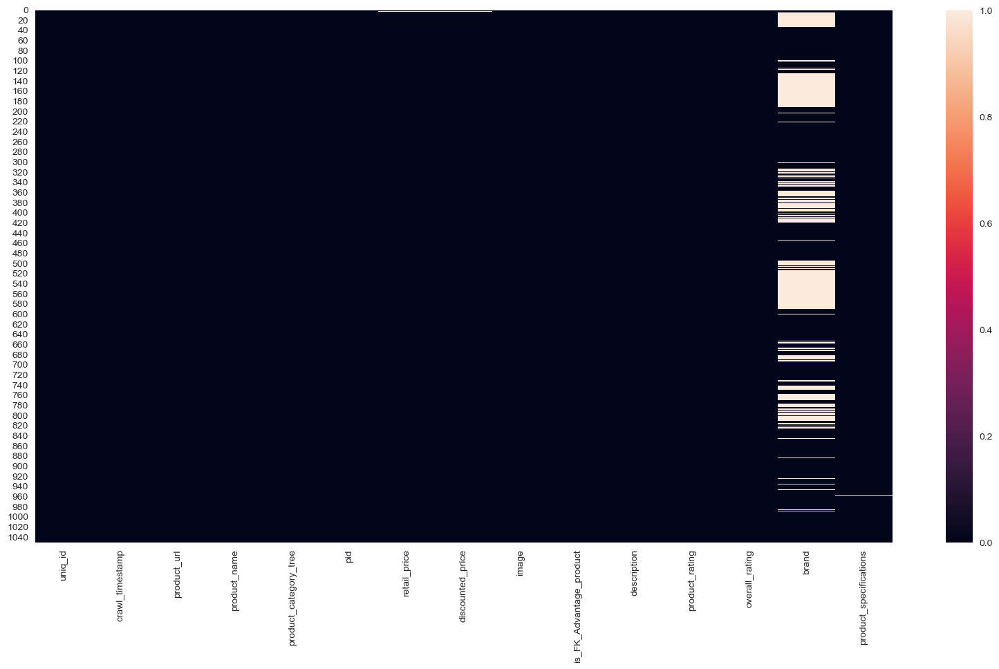

In [579]:
#visualiser les valeurs manquantes
plt.figure(figsize=(20,10))
sns.heatmap(products.isna(), cbar=True)

In [580]:
(products.isna().sum()/products.shape[0]).sort_values(ascending=True)

uniq_id                    0.000000
crawl_timestamp            0.000000
product_url                0.000000
product_name               0.000000
product_category_tree      0.000000
pid                        0.000000
image                      0.000000
is_FK_Advantage_product    0.000000
description                0.000000
product_rating             0.000000
overall_rating             0.000000
retail_price               0.000952
discounted_price           0.000952
product_specifications     0.000952
brand                      0.321905
dtype: float64

### Obsevation :
- La colonne 'brand' contient plus de 30 % de données manquantes
- Dans l'ensemble les colonnes sont très bien renseignées (taux de remplissage > 90%)

###  Traitement des valeurs manquantes

In [581]:
# Les valeurs manquantes pour la variable "brand" sont remplacés par "".
products["brand"].fillna("", inplace=True)

### crawl_timestamp - Horodatage

In [582]:
# Transforme de Object en Datetime
products['crawl_timestamp'] = pd.to_datetime(products['crawl_timestamp'])
# Période de notre sous-jeu de données
min = products['crawl_timestamp'].min().strftime('%d/%m/%Y')
max = products['crawl_timestamp'].max().strftime('%d/%m/%Y')
print(f'Période d\'ajout des produits : du {min} au {max}')

Période d'ajout des produits : du 01/12/2015 au 26/06/2016


### Les catégories produits

In [583]:
products.head(2).T

,0,1
uniq_id,55b85ea15a1536d46b7190ad6fff8ce7,7b72c92c2f6c40268628ec5f14c6d590
crawl_timestamp,2016-04-30 03:22:56+00:00,2016-04-30 03:22:56+00:00
product_url,http://www.flipkart.com/elegance-polyester-mul...,http://www.flipkart.com/sathiyas-cotton-bath-t...
product_name,Elegance Polyester Multicolor Abstract Eyelet ...,Sathiyas Cotton Bath Towel
product_category_tree,"[""Home Furnishing >> Curtains & Accessories >>...","[""Baby Care >> Baby Bath & Skin >> Baby Bath T..."
pid,CRNEG7BKMFFYHQ8Z,BTWEGFZHGBXPHZUH
retail_price,1899.0,600.0
discounted_price,899.0,449.0
image,55b85ea15a1536d46b7190ad6fff8ce7.jpg,7b72c92c2f6c40268628ec5f14c6d590.jpg
is_FK_Advantage_product,False,False


In [584]:
products['product_category_tree'].head(10)

0    ["Home Furnishing >> Curtains & Accessories >>...
1    ["Baby Care >> Baby Bath & Skin >> Baby Bath T...
2    ["Baby Care >> Baby Bath & Skin >> Baby Bath T...
3    ["Home Furnishing >> Bed Linen >> Bedsheets >>...
4    ["Home Furnishing >> Bed Linen >> Bedsheets >>...
5    ["Watches >> Wrist Watches >> Maserati Time Wr...
6    ["Watches >> Wrist Watches >> Camerii Wrist Wa...
7    ["Watches >> Wrist Watches >> T STAR Wrist Wat...
8    ["Watches >> Wrist Watches >> Alfajr Wrist Wat...
9    ["Watches >> Wrist Watches >> TAG Heuer Wrist ...
Name: product_category_tree, dtype: object

### Observation 
- On remarque  que la colonne product_category_tree a une catégorie principale et des sous catégories,
- On va détailler les différents informations de bute  de connaitre le nombre de catégories

In [585]:
# On récupère la colomne "product_category_tree"
list_categories_0, list_categories_1 = [], []
for txt in products["product_category_tree"] :
    
    list_categories_0.append(txt.split(">>")[0].split("\"")[1].strip()) # split du nom par >> et on récupère la première partie
    list_categories_1.append(txt.split(">>")[1].strip()) # split du nom par >> et on récupère la première partie

# Création d'une nouvelle série catégorie    
products["category_0"] = pd.Series(list_categories_0)
products["category_1"] = pd.Series(list_categories_1)

print("Il y a {} catégories de niveau 0 et {} categories de niveau 1".format(products["category_0"].nunique(), products["category_1"].nunique()))

Il y a 7 catégories de niveau 0 et 63 categories de niveau 1


In [586]:
pd.set_option('display.max_row',62)
products["product_category_tree"].value_counts()

["Home Furnishing >> Bed Linen >> Blankets, Quilts & Dohars"]                         56
["Kitchen & Dining >> Coffee Mugs >> Prithish Coffee Mugs"]                           26
["Watches >> Wrist Watches >> Maxima Wrist Watches"]                                  23
["Kitchen & Dining >> Coffee Mugs >> Rockmantra Coffee Mugs"]                         22
["Home Furnishing >> Bath Linen >> Towels"]                                           19
                                                                                      ..
["Home Decor & Festive Needs >> Showpieces >> Ethnic >> Infinity India Ethnic"]        1
["Home Decor & Festive Needs >> Showpieces >> Ethnic >> Ravishing Variety Ethnic"]     1
["Home Decor & Festive Needs >> Showpieces >> Ethnic >> Pg handicrafts Ethnic"]        1
["Home Decor & Festive Needs >> Showpieces >> Ethnic >> Homedesires Ethnic"]           1
["Watches >> Wrist Watches >> Petrol Wrist Watches"]                                   1
Name: product_categor

In [587]:
print(products["product_category_tree"][0])

["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]


### Catégories de niveau 0

In [588]:
font_title = {"weight": "bold",
              "size": 30}

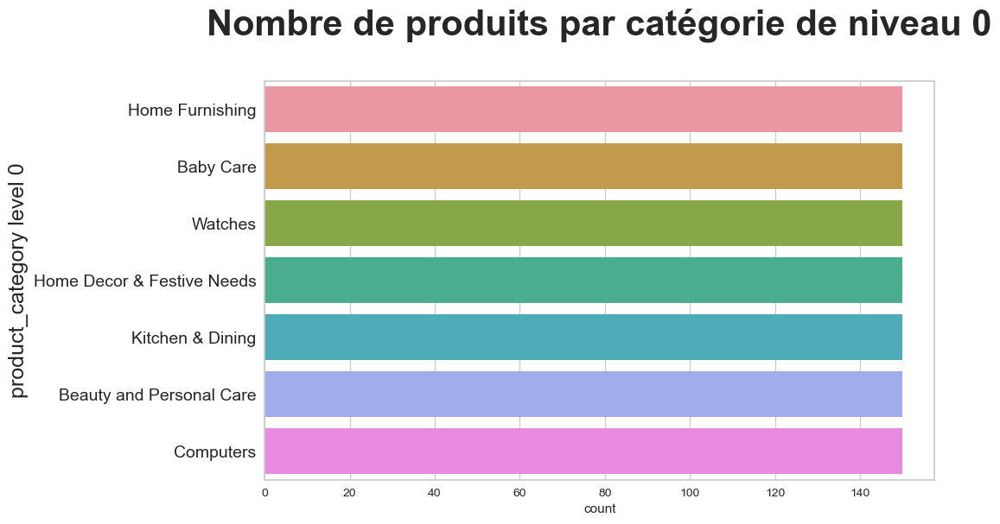

In [589]:
fig = plt.figure(figsize=(10, 6))
sns.countplot(data=products, y="category_0",
             order = products["category_0"].value_counts().index,)
plt.yticks(size=14)
plt.title(f"Nombre de produits par catégorie de niveau 0\n",
          fontdict=font_title)
plt.ylabel("product_category level 0", fontsize=18)
plt.show()

### Catégories de niveau 1

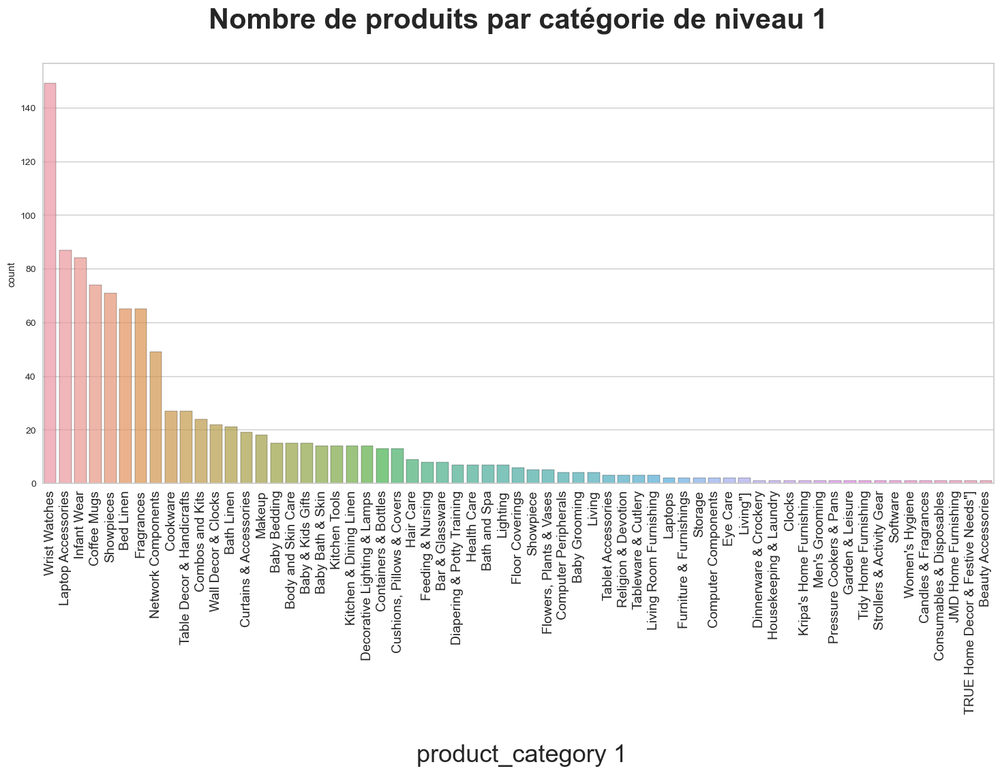

In [590]:
fig = plt.figure(figsize=(18, 8))
sns.countplot(data=products, x="category_1",
              edgecolor="black",
              order = products['category_1'].value_counts().index,
              alpha=0.7)
plt.xticks(rotation=90, size=14)
plt.title(f"Nombre de produits par catégorie de niveau 1\n",
          fontdict=font_title)
plt.xlabel('\n product_category 1', fontsize=26)
plt.show()

## 2.Sélection des features à traiter

In [591]:
# Les catégories utilisés pour la résolution du problème de segmentation
categories = products["category_0"]

Seules 3 features nous interresse dans cette partie :

- 'product_name' correspond au titre du produit
- 'description' comme son nom l'indique, à sa description
- 'category_0' renseigne sur la catégorie du produit de niveau 0 .

On fusionne le titre et la description du produit pour ne garder qu'un unique champ contenant l'ensemble des termes décrivant l'object

In [592]:
products_text_data = pd.DataFrame()
products_text_data["uniq_id"] = products["uniq_id"]
products_text_data["category"] = products["category_0"]
products_text_data["description"] = products["product_name"] + " "+ products["brand"] + " " + products["description"]
products_text_data

,uniq_id,category,description
0,55b85ea15a1536d46b7190ad6fff8ce7,Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet ...
1,7b72c92c2f6c40268628ec5f14c6d590,Baby Care,Sathiyas Cotton Bath Towel Sathiyas Specificat...
2,64d5d4a258243731dc7bbb1eef49ad74,Baby Care,Eurospa Cotton Terry Face Towel Set Eurospa Ke...
3,d4684dcdc759dd9cdf41504698d737d8,Home Furnishing,SANTOSH ROYAL FASHION Cotton Printed King size...
4,6325b6870c54cd47be6ebfbffa620ec7,Home Furnishing,Jaipur Print Cotton Floral King sized Double B...
...,...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc,Baby Care,Oren Empower Extra Large Self Adhesive Sticker...
1046,fd6cbcc22efb6b761bd564c28928483c,Baby Care,Wallmantra Large Vinyl Sticker Sticker Wallman...
1047,5912e037d12774bb73a2048f35a00009,Baby Care,Uberlyfe Extra Large Pigmented Polyvinyl Films...
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,Baby Care,Wallmantra Medium Vinyl Sticker Sticker Wallma...


In [593]:
products['category_0'].value_counts()

Home Furnishing               150
Baby Care                     150
Watches                       150
Home Decor & Festive Needs    150
Kitchen & Dining              150
Beauty and Personal Care      150
Computers                     150
Name: category_0, dtype: int64

<AxesSubplot:title={'center':'Répartition des catégories'}, ylabel='category_0'>

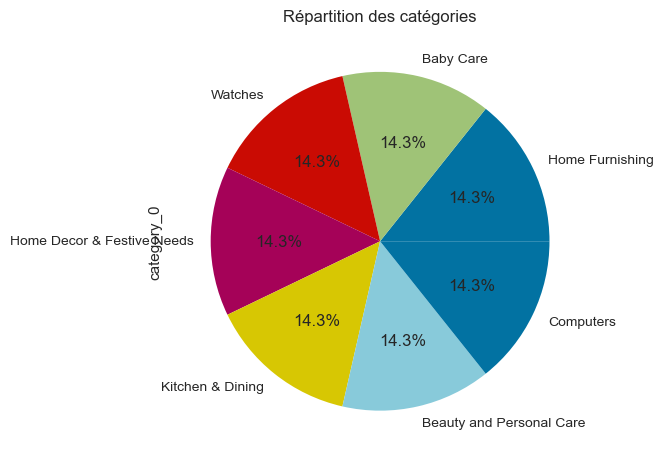

In [594]:
products['category_0'].value_counts().plot(kind='pie',autopct="%1.1f%%", title = "Répartition des catégories")

### Observation :
- On trouve 7 catégories dans category_0

In [595]:
# Chargement du jeu de données
products.to_csv('data_claned.csv',index=False )

## 3.Analyse exploratoire : Pré-Traitement

###  1 Texte :

### 1.1 Suppression des ponctuations

In [144]:
#On va supprimer tous les caractéres spéciaux (! "# $% & '() * +, -. / :; <=>? @ [] ^ _` {|} ~)
#qui ne donnent aucune information

In [145]:
import string

In [146]:
# fonction qui enleve toutes les ponctuations 
myTuple = ("John", "Peter", "Vicky")

x = "#".join(myTuple)
print(x)

John#Peter#Vicky


In [147]:
def suppression_ponctuation(text):
      text_nopunc ="".join([char for char in text if char not in string.punctuation])
      return text_nopunc

In [148]:
suppression_ponctuation(products['description'][0])

'Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral CurtainElegance Polyester Multicolor Abstract Eyelet Door Curtain 213 cm in Height Pack of 2 Price Rs 899 This curtain enhances the look of the interiorsThis curtain is made from 100 high quality polyester fabricIt features an eyelet style stitch with Metal RingIt makes the room environment romantic and lovingThis curtain is ant wrinkle and anti shrinkage and have elegant apparanceGive your home a bright and modernistic appeal with these designs The surreal attention is sure to steal hearts These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening you create the most special moments of joyous beauty given by the soothing prints Bring home the elegant curtain that softly filters light in your room so that you get the right am

In [149]:
products_text_data['description_nopunc']=products_text_data['description'].apply(lambda x: suppression_ponctuation(x))

In [150]:
products_text_data[['description','description_nopunc']]

,description,description_nopunc
0,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...
1,Sathiyas Cotton Bath Towel Sathiyas Specificat...,Sathiyas Cotton Bath Towel Sathiyas Specificat...
2,Eurospa Cotton Terry Face Towel Set Eurospa Ke...,Eurospa Cotton Terry Face Towel Set Eurospa Ke...
3,SANTOSH ROYAL FASHION Cotton Printed King size...,SANTOSH ROYAL FASHION Cotton Printed King size...
4,Jaipur Print Cotton Floral King sized Double B...,Jaipur Print Cotton Floral King sized Double B...
...,...,...
1045,Oren Empower Extra Large Self Adhesive Sticker...,Oren Empower Extra Large Self Adhesive Sticker...
1046,Wallmantra Large Vinyl Sticker Sticker Wallman...,Wallmantra Large Vinyl Sticker Sticker Wallman...
1047,Uberlyfe Extra Large Pigmented Polyvinyl Films...,Uberlyfe Extra Large Pigmented Polyvinyl Films...
1048,Wallmantra Medium Vinyl Sticker Sticker Wallma...,Wallmantra Medium Vinyl Sticker Sticker Wallma...


In [151]:
# on va remplacer tous les chiffres qu'on trouve par un espace
def remplace(string):
      string.replace('[0-9]','')
      return string

In [152]:
import nltk
nltk.download('punkt')
#https://www.debuggex.com/cheatsheet/regex/python
#https://www.kite.com/python/docs/nltk.RegexpTokenizer
def Harmonisation(text):
  tokenizer = nltk.RegexpTokenizer(r'\w+')
  #tokenizer = RegexpTokenizer('\w+|$[\d\.]+|\S+')
  #il prend en compte le caractere d'un mot 1 ou plus 
  #echappe un caractere special
  #retourne un tableau divisé avec les expressions regulieres 
  tokens=tokenizer.tokenize(text)
  return tokens

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\yosra\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [153]:
products_text_data['description'].apply(lambda x : Harmonisation(x))

0       [Elegance, Polyester, Multicolor, Abstract, Ey...
1       [Sathiyas, Cotton, Bath, Towel, Sathiyas, Spec...
2       [Eurospa, Cotton, Terry, Face, Towel, Set, Eur...
3       [SANTOSH, ROYAL, FASHION, Cotton, Printed, Kin...
4       [Jaipur, Print, Cotton, Floral, King, sized, D...
                              ...                        
1045    [Oren, Empower, Extra, Large, Self, Adhesive, ...
1046    [Wallmantra, Large, Vinyl, Sticker, Sticker, W...
1047    [Uberlyfe, Extra, Large, Pigmented, Polyvinyl,...
1048    [Wallmantra, Medium, Vinyl, Sticker, Sticker, ...
1049    [Uberlyfe, Large, Vinyl, Sticker, Uberlyfe, Bu...
Name: description, Length: 1050, dtype: object

In [154]:
products_text_data['description_nopunc'].apply(remplace)

0       Elegance Polyester Multicolor Abstract Eyelet ...
1       Sathiyas Cotton Bath Towel Sathiyas Specificat...
2       Eurospa Cotton Terry Face Towel Set Eurospa Ke...
3       SANTOSH ROYAL FASHION Cotton Printed King size...
4       Jaipur Print Cotton Floral King sized Double B...
                              ...                        
1045    Oren Empower Extra Large Self Adhesive Sticker...
1046    Wallmantra Large Vinyl Sticker Sticker Wallman...
1047    Uberlyfe Extra Large Pigmented Polyvinyl Films...
1048    Wallmantra Medium Vinyl Sticker Sticker Wallma...
1049    Uberlyfe Large Vinyl Sticker Uberlyfe Buy Uber...
Name: description_nopunc, Length: 1050, dtype: object

In [155]:
products_text_data['description_nodg']=products_text_data['description_nopunc'].str.replace('[0-9]','')

C:\Users\yosra\AppData\Local\Temp\ipykernel_11672\3040070353.py:1: FutureWarning:

The default value of regex will change from True to False in a future version.



In [156]:
products_text_data[['description','description_nopunc','description_nodg']].head(6)

,description,description_nopunc,description_nodg
0,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...
1,Sathiyas Cotton Bath Towel Sathiyas Specificat...,Sathiyas Cotton Bath Towel Sathiyas Specificat...,Sathiyas Cotton Bath Towel Sathiyas Specificat...
2,Eurospa Cotton Terry Face Towel Set Eurospa Ke...,Eurospa Cotton Terry Face Towel Set Eurospa Ke...,Eurospa Cotton Terry Face Towel Set Eurospa Ke...
3,SANTOSH ROYAL FASHION Cotton Printed King size...,SANTOSH ROYAL FASHION Cotton Printed King size...,SANTOSH ROYAL FASHION Cotton Printed King size...
4,Jaipur Print Cotton Floral King sized Double B...,Jaipur Print Cotton Floral King sized Double B...,Jaipur Print Cotton Floral King sized Double B...
5,Maserati Time R8851116001 Analog Watch - For ...,Maserati Time R8851116001 Analog Watch For B...,Maserati Time R Analog Watch For Boys Maser...


### 1.2 Tokennisation

In [157]:
# On va faire la tokennisation c'est à dire séparer les mots

In [158]:
import nltk
nltk.download('punkt')
def Tokennisationetnorm(text):
      tokens=nltk.word_tokenize(text.lower())
  #tokens=nltk.word_tokenize(text)
      return tokens

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\yosra\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [159]:
products_text_data['token'] = products_text_data['description_nodg'].apply(lambda X : Tokennisationetnorm(X))
products_text_data.head(3)

,uniq_id,category,description,description_nopunc,description_nodg,token
0,55b85ea15a1536d46b7190ad6fff8ce7,Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,"[elegance, polyester, multicolor, abstract, ey..."
1,7b72c92c2f6c40268628ec5f14c6d590,Baby Care,Sathiyas Cotton Bath Towel Sathiyas Specificat...,Sathiyas Cotton Bath Towel Sathiyas Specificat...,Sathiyas Cotton Bath Towel Sathiyas Specificat...,"[sathiyas, cotton, bath, towel, sathiyas, spec..."
2,64d5d4a258243731dc7bbb1eef49ad74,Baby Care,Eurospa Cotton Terry Face Towel Set Eurospa Ke...,Eurospa Cotton Terry Face Towel Set Eurospa Ke...,Eurospa Cotton Terry Face Towel Set Eurospa Ke...,"[eurospa, cotton, terry, face, towel, set, eur..."


### 1.3 Suppression des tokens de taille < 2

In [160]:
#Suppression les mots de taille < 2

In [161]:
def remove_small_words(text):
    
    #Suppression les mots de taille <2 
    
    return [x for x in text if len(x) >2 ]

In [162]:
products_text_data['tokens'] = products_text_data['token'].apply(lambda x : remove_small_words(x))
products_text_data.head(3)

,uniq_id,category,description,description_nopunc,description_nodg,token,tokens
0,55b85ea15a1536d46b7190ad6fff8ce7,Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,"[elegance, polyester, multicolor, abstract, ey...","[elegance, polyester, multicolor, abstract, ey..."
1,7b72c92c2f6c40268628ec5f14c6d590,Baby Care,Sathiyas Cotton Bath Towel Sathiyas Specificat...,Sathiyas Cotton Bath Towel Sathiyas Specificat...,Sathiyas Cotton Bath Towel Sathiyas Specificat...,"[sathiyas, cotton, bath, towel, sathiyas, spec...","[sathiyas, cotton, bath, towel, sathiyas, spec..."
2,64d5d4a258243731dc7bbb1eef49ad74,Baby Care,Eurospa Cotton Terry Face Towel Set Eurospa Ke...,Eurospa Cotton Terry Face Towel Set Eurospa Ke...,Eurospa Cotton Terry Face Towel Set Eurospa Ke...,"[eurospa, cotton, terry, face, towel, set, eur...","[eurospa, cotton, terry, face, towel, set, eur..."


In [163]:
products_text_data[['description','tokens']]

,description,tokens
0,Elegance Polyester Multicolor Abstract Eyelet ...,"[elegance, polyester, multicolor, abstract, ey..."
1,Sathiyas Cotton Bath Towel Sathiyas Specificat...,"[sathiyas, cotton, bath, towel, sathiyas, spec..."
2,Eurospa Cotton Terry Face Towel Set Eurospa Ke...,"[eurospa, cotton, terry, face, towel, set, eur..."
3,SANTOSH ROYAL FASHION Cotton Printed King size...,"[santosh, royal, fashion, cotton, printed, kin..."
4,Jaipur Print Cotton Floral King sized Double B...,"[jaipur, print, cotton, floral, king, sized, d..."
...,...,...
1045,Oren Empower Extra Large Self Adhesive Sticker...,"[oren, empower, extra, large, self, adhesive, ..."
1046,Wallmantra Large Vinyl Sticker Sticker Wallman...,"[wallmantra, large, vinyl, sticker, sticker, w..."
1047,Uberlyfe Extra Large Pigmented Polyvinyl Films...,"[uberlyfe, extra, large, pigmented, polyvinyl,..."
1048,Wallmantra Medium Vinyl Sticker Sticker Wallma...,"[wallmantra, medium, vinyl, sticker, sticker, ..."


### 1.4  Suppression des stopwords

In [164]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\yosra\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [165]:
import nltk
stopword=nltk.corpus.stopwords.words('english')

#### On va faire supprimer les stopwords c'est à dire les  mots qui apparaissent très fréquemment mais qui n'ajoutent aucun  sens à la phrase.

In [166]:
def remove_stopwords(text):
    ''' 
     la liste du corpus NLTK est utilisée pour une correspondance. Cependant, une liste personnalisée
    personnalisée définie par l'utilisateur pourrait être créée et utilisée pour limiter
    les correspondances dans le texte d'entrée. 
    '''
    return [word for word in text if word not in nltk.corpus.stopwords.words('english')]

In [167]:
# No_stopwords

#stop = stopwords.words('english')
products_text_data['net_tokens'] = products_text_data['tokens'].apply(lambda x:remove_stopwords(x))
products_text_data.head(2)

,uniq_id,category,description,description_nopunc,description_nodg,token,tokens,net_tokens
0,55b85ea15a1536d46b7190ad6fff8ce7,Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,"[elegance, polyester, multicolor, abstract, ey...","[elegance, polyester, multicolor, abstract, ey...","[elegance, polyester, multicolor, abstract, ey..."
1,7b72c92c2f6c40268628ec5f14c6d590,Baby Care,Sathiyas Cotton Bath Towel Sathiyas Specificat...,Sathiyas Cotton Bath Towel Sathiyas Specificat...,Sathiyas Cotton Bath Towel Sathiyas Specificat...,"[sathiyas, cotton, bath, towel, sathiyas, spec...","[sathiyas, cotton, bath, towel, sathiyas, spec...","[sathiyas, cotton, bath, towel, sathiyas, spec..."


In [168]:
products_text_data[['description','net_tokens']]

,description,net_tokens
0,Elegance Polyester Multicolor Abstract Eyelet ...,"[elegance, polyester, multicolor, abstract, ey..."
1,Sathiyas Cotton Bath Towel Sathiyas Specificat...,"[sathiyas, cotton, bath, towel, sathiyas, spec..."
2,Eurospa Cotton Terry Face Towel Set Eurospa Ke...,"[eurospa, cotton, terry, face, towel, set, eur..."
3,SANTOSH ROYAL FASHION Cotton Printed King size...,"[santosh, royal, fashion, cotton, printed, kin..."
4,Jaipur Print Cotton Floral King sized Double B...,"[jaipur, print, cotton, floral, king, sized, d..."
...,...,...
1045,Oren Empower Extra Large Self Adhesive Sticker...,"[oren, empower, extra, large, self, adhesive, ..."
1046,Wallmantra Large Vinyl Sticker Sticker Wallman...,"[wallmantra, large, vinyl, sticker, sticker, w..."
1047,Uberlyfe Extra Large Pigmented Polyvinyl Films...,"[uberlyfe, extra, large, pigmented, polyvinyl,..."
1048,Wallmantra Medium Vinyl Sticker Sticker Wallma...,"[wallmantra, medium, vinyl, sticker, sticker, ..."


### 1.5 Stemming

In [169]:
# Cela consiste à ne conserver que la racine des mots étudiés.
#L'idée étant de supprimer les suffixes, préfixes et autres des mots afin de ne conserver que leur origine

In [170]:
from nltk import PorterStemmer, WordNetLemmatizer, word_tokenize, FreqDist

In [171]:
from nltk.stem.snowball import EnglishStemmer
stemm=EnglishStemmer()
def stem_word(text):
      stem_text=[stemm.stem(word)for word in text] 
      return stem_text

In [172]:
def stemming(text):
    
    #Apply stemming to get root words
        ps = PorterStemmer()
        return [ps.stem(word) for word in text]

In [173]:
products_text_data['stem_words'] = products_text_data['net_tokens'].apply(lambda x:stemming(x))
products_text_data.head(2)

,uniq_id,category,description,description_nopunc,description_nodg,token,tokens,net_tokens,stem_words
0,55b85ea15a1536d46b7190ad6fff8ce7,Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,"[elegance, polyester, multicolor, abstract, ey...","[elegance, polyester, multicolor, abstract, ey...","[elegance, polyester, multicolor, abstract, ey...","[eleg, polyest, multicolor, abstract, eyelet, ..."
1,7b72c92c2f6c40268628ec5f14c6d590,Baby Care,Sathiyas Cotton Bath Towel Sathiyas Specificat...,Sathiyas Cotton Bath Towel Sathiyas Specificat...,Sathiyas Cotton Bath Towel Sathiyas Specificat...,"[sathiyas, cotton, bath, towel, sathiyas, spec...","[sathiyas, cotton, bath, towel, sathiyas, spec...","[sathiyas, cotton, bath, towel, sathiyas, spec...","[sathiya, cotton, bath, towel, sathiya, specif..."


In [174]:
products_text_data[['description','stem_words']]

,description,stem_words
0,Elegance Polyester Multicolor Abstract Eyelet ...,"[eleg, polyest, multicolor, abstract, eyelet, ..."
1,Sathiyas Cotton Bath Towel Sathiyas Specificat...,"[sathiya, cotton, bath, towel, sathiya, specif..."
2,Eurospa Cotton Terry Face Towel Set Eurospa Ke...,"[eurospa, cotton, terri, face, towel, set, eur..."
3,SANTOSH ROYAL FASHION Cotton Printed King size...,"[santosh, royal, fashion, cotton, print, king,..."
4,Jaipur Print Cotton Floral King sized Double B...,"[jaipur, print, cotton, floral, king, size, do..."
...,...,...
1045,Oren Empower Extra Large Self Adhesive Sticker...,"[oren, empow, extra, larg, self, adhes, sticke..."
1046,Wallmantra Large Vinyl Sticker Sticker Wallman...,"[wallmantra, larg, vinyl, sticker, sticker, wa..."
1047,Uberlyfe Extra Large Pigmented Polyvinyl Films...,"[uberlyf, extra, larg, pigment, polyvinyl, fil..."
1048,Wallmantra Medium Vinyl Sticker Sticker Wallma...,"[wallmantra, medium, vinyl, sticker, sticker, ..."


### 1.6 Lemmatization

In [175]:
import nltk
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\yosra\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [176]:
#Le processus de lemmatisation consiste à représenter les mots (ou lemmes) sous leur forme 
#canonique pour ne conserver que le sens des mots utilisés dans le corpus

In [177]:
def lemmatize(text):
    
    #Apply lemmatization on tokens
    word_net = WordNetLemmatizer()
    return [word_net.lemmatize(word) for word in text]

In [178]:
products_text_data['lem_words'] = products_text_data['stem_words'].apply(lambda x:lemmatize(x))
products_text_data.head(2)

,uniq_id,category,description,description_nopunc,description_nodg,token,tokens,net_tokens,stem_words,lem_words
0,55b85ea15a1536d46b7190ad6fff8ce7,Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,"[elegance, polyester, multicolor, abstract, ey...","[elegance, polyester, multicolor, abstract, ey...","[elegance, polyester, multicolor, abstract, ey...","[eleg, polyest, multicolor, abstract, eyelet, ...","[eleg, polyest, multicolor, abstract, eyelet, ..."
1,7b72c92c2f6c40268628ec5f14c6d590,Baby Care,Sathiyas Cotton Bath Towel Sathiyas Specificat...,Sathiyas Cotton Bath Towel Sathiyas Specificat...,Sathiyas Cotton Bath Towel Sathiyas Specificat...,"[sathiyas, cotton, bath, towel, sathiyas, spec...","[sathiyas, cotton, bath, towel, sathiyas, spec...","[sathiyas, cotton, bath, towel, sathiyas, spec...","[sathiya, cotton, bath, towel, sathiya, specif...","[sathiya, cotton, bath, towel, sathiya, specif..."


In [179]:
products_text_data[['description','lem_words']]

,description,lem_words
0,Elegance Polyester Multicolor Abstract Eyelet ...,"[eleg, polyest, multicolor, abstract, eyelet, ..."
1,Sathiyas Cotton Bath Towel Sathiyas Specificat...,"[sathiya, cotton, bath, towel, sathiya, specif..."
2,Eurospa Cotton Terry Face Towel Set Eurospa Ke...,"[eurospa, cotton, terri, face, towel, set, eur..."
3,SANTOSH ROYAL FASHION Cotton Printed King size...,"[santosh, royal, fashion, cotton, print, king,..."
4,Jaipur Print Cotton Floral King sized Double B...,"[jaipur, print, cotton, floral, king, size, do..."
...,...,...
1045,Oren Empower Extra Large Self Adhesive Sticker...,"[oren, empow, extra, larg, self, adhes, sticke..."
1046,Wallmantra Large Vinyl Sticker Sticker Wallman...,"[wallmantra, larg, vinyl, sticker, sticker, wa..."
1047,Uberlyfe Extra Large Pigmented Polyvinyl Films...,"[uberlyf, extra, larg, pigment, polyvinyl, fil..."
1048,Wallmantra Medium Vinyl Sticker Sticker Wallma...,"[wallmantra, medium, vinyl, sticker, sticker, ..."


In [180]:
def return_sentences(tokens):
    
    #Create sentences to get clean text as input for vectors
    
    return " ".join([word for word in tokens])

In [181]:
products_text_data['clean_text'] = products_text_data['lem_words'].apply(lambda x : return_sentences(x))
products_text_data.head(3)

,uniq_id,category,description,description_nopunc,description_nodg,token,tokens,net_tokens,stem_words,lem_words,clean_text
0,55b85ea15a1536d46b7190ad6fff8ce7,Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,"[elegance, polyester, multicolor, abstract, ey...","[elegance, polyester, multicolor, abstract, ey...","[elegance, polyester, multicolor, abstract, ey...","[eleg, polyest, multicolor, abstract, eyelet, ...","[eleg, polyest, multicolor, abstract, eyelet, ...",eleg polyest multicolor abstract eyelet door c...
1,7b72c92c2f6c40268628ec5f14c6d590,Baby Care,Sathiyas Cotton Bath Towel Sathiyas Specificat...,Sathiyas Cotton Bath Towel Sathiyas Specificat...,Sathiyas Cotton Bath Towel Sathiyas Specificat...,"[sathiyas, cotton, bath, towel, sathiyas, spec...","[sathiyas, cotton, bath, towel, sathiyas, spec...","[sathiyas, cotton, bath, towel, sathiyas, spec...","[sathiya, cotton, bath, towel, sathiya, specif...","[sathiya, cotton, bath, towel, sathiya, specif...",sathiya cotton bath towel sathiya specif sathi...
2,64d5d4a258243731dc7bbb1eef49ad74,Baby Care,Eurospa Cotton Terry Face Towel Set Eurospa Ke...,Eurospa Cotton Terry Face Towel Set Eurospa Ke...,Eurospa Cotton Terry Face Towel Set Eurospa Ke...,"[eurospa, cotton, terry, face, towel, set, eur...","[eurospa, cotton, terry, face, towel, set, eur...","[eurospa, cotton, terry, face, towel, set, eur...","[eurospa, cotton, terri, face, towel, set, eur...","[eurospa, cotton, terri, face, towel, set, eur...",eurospa cotton terri face towel set eurospa ke...


### 1.7 Conversion des mots en vecteurs de features (BOW, TF-IDF)

 Affichage des Top 10 mots les plus fréquents pour chaque catégorie produit de niveau 0

In [182]:
def freq(data_series, nb):
  
        #Compte les occurrences de chaque mot dans data_series
       # et renvoie les nb les plus fréquents avec leur associés.
        
        
    all_words = []

    for word_list in data_series:
        all_words += word_list
        
    freq_dict = nltk.FreqDist(all_words)

    df = pd.DataFrame.from_dict(freq_dict, orient='index').rename(columns={0:"freq"})

    return df.sort_values(by="freq", ascending=False).head(nb)

In [183]:
def plot_freq_dist(data_df, title, long, larg):
    '''
        Displays a bar chart showing the frequency of the modalities
        for each column of data.
        Parameters
        ----------------
        data  : dataframe
                Working data containing exclusively qualitative data
               
        title : string
                The title to give the plot
        long  : int
                The length of the figure for the plot
        larg  : int
                The width of the figure for the plot
        Returns
         '''

    TITLE_SIZE = 40
    TITLE_PAD = 80
    TICK_SIZE = 12
    LABEL_SIZE = 30
    LABEL_PAD = 20

    # Initialize the matplotlib figure
    _, axis = plt.subplots(figsize=(long, larg))

    plt.title(title,
              fontweight="bold",
              fontsize=TITLE_SIZE, pad=TITLE_PAD)

    # Plot the Total values
    data_to_plot = data_df.reset_index().rename(columns={"index":"words"})
    handle_plot_1 = sns.barplot(x="words", y="freq", data=data_to_plot,
                                label="non renseignées", color="blue", alpha=1)

    _, xlabels = plt.xticks()
    _ = handle_plot_1.set_xticklabels(xlabels, size=TICK_SIZE, rotation=45)
    
    x_label = axis.get_xlabel()
    axis.set_xlabel(x_label, fontsize=LABEL_SIZE, labelpad=LABEL_PAD, fontweight="bold")

    y_label = axis.get_ylabel()
    axis.set_ylabel(y_label, fontsize=LABEL_SIZE, labelpad=LABEL_PAD, fontweight="bold")

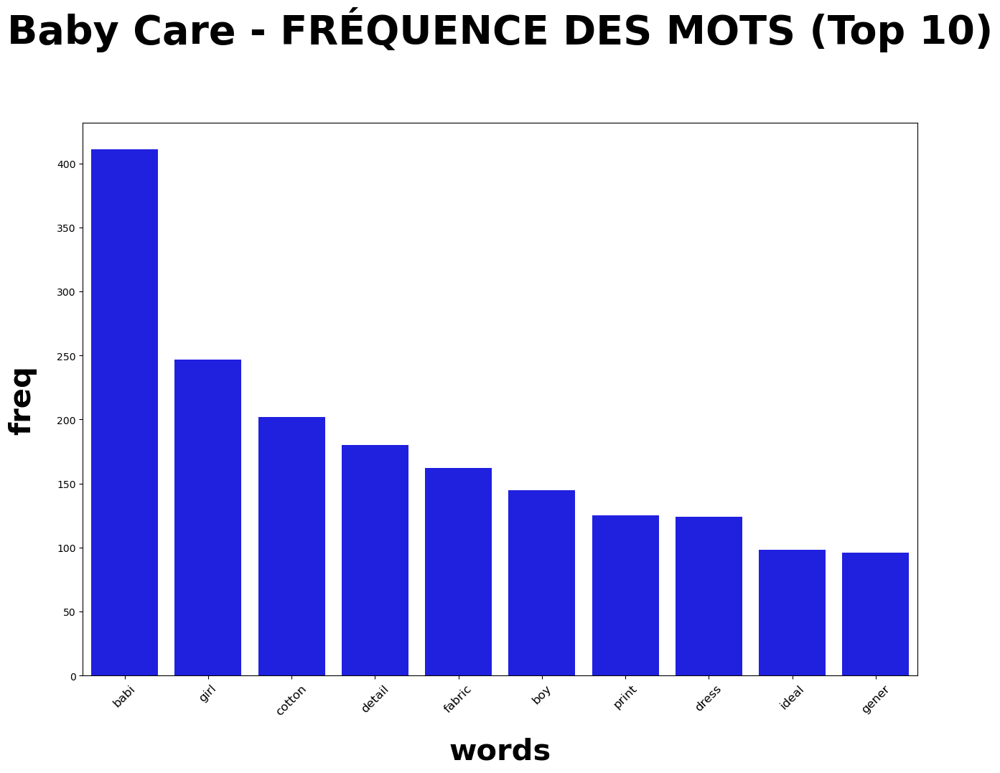

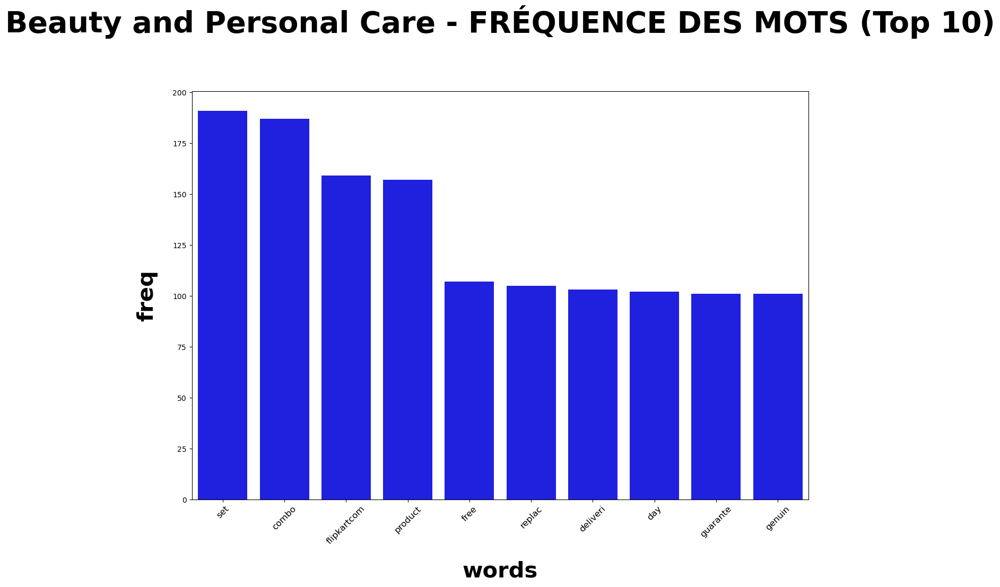

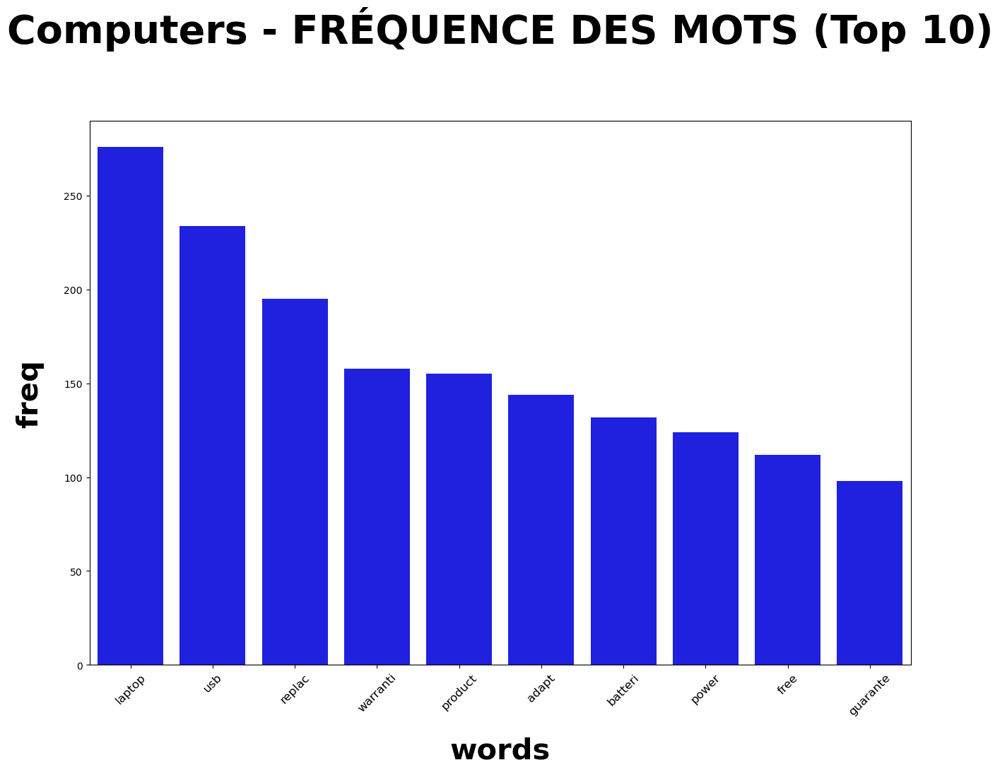

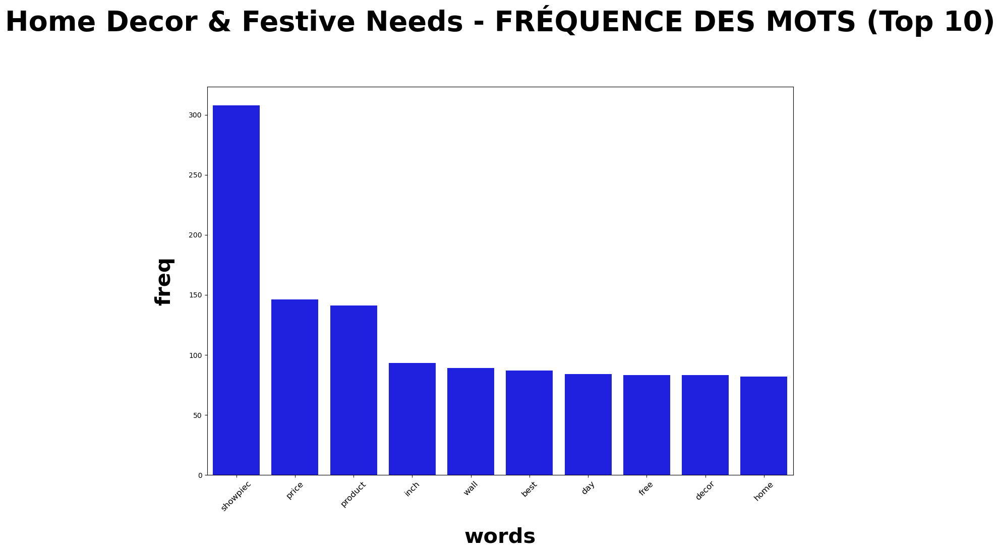

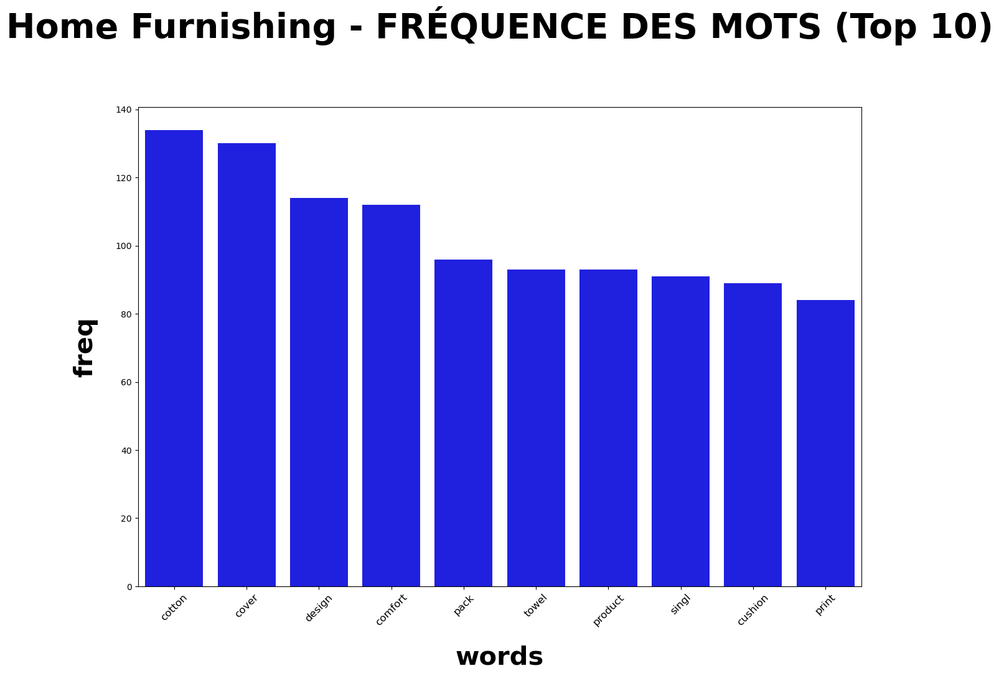

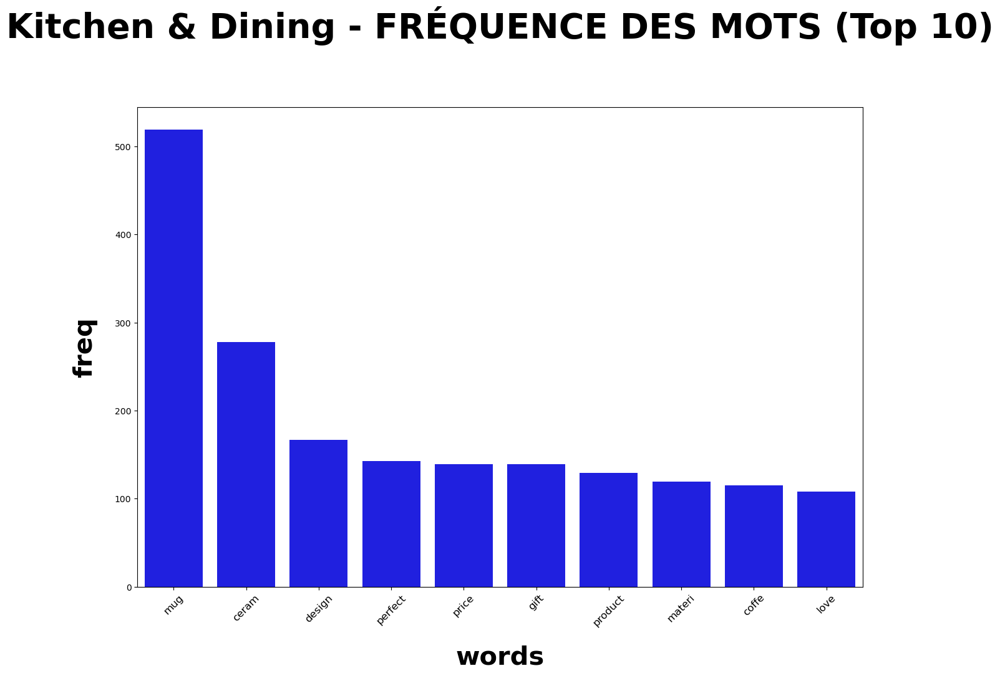

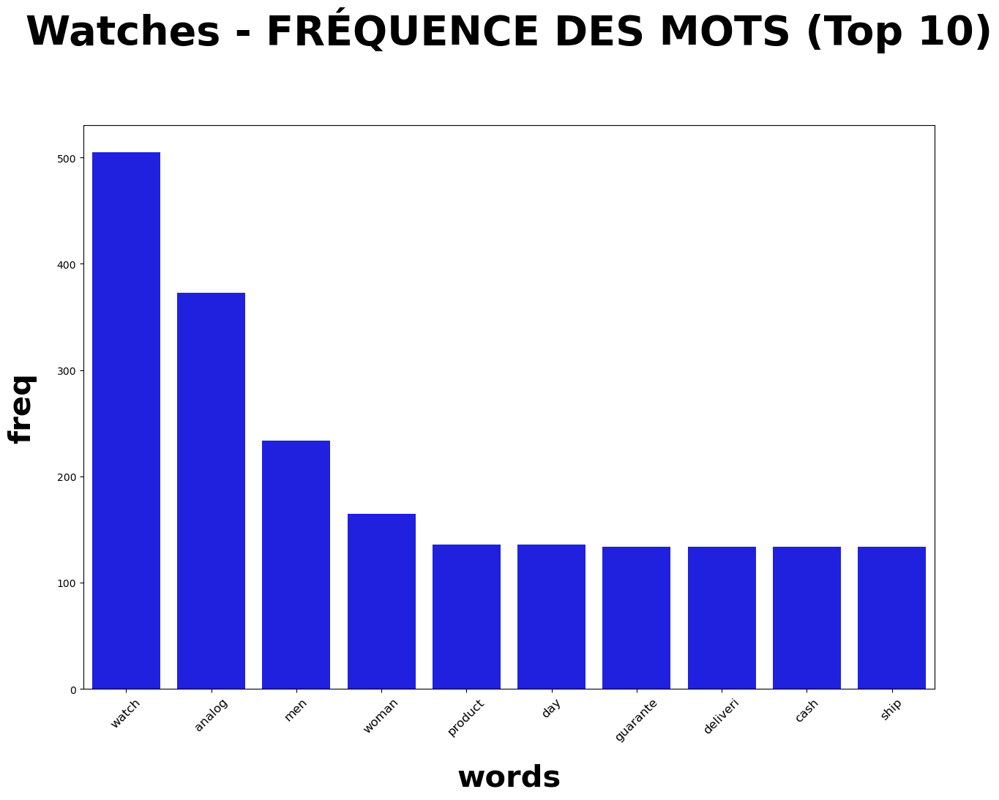

In [184]:
dfs_freq = pd.DataFrame()

for cat1, data_df in products_text_data.groupby("category"):
    df_freq = freq(data_df["lem_words"], 10).reset_index()
    df_freq["Category"] = cat1
    dfs_freq= pd.concat([dfs_freq, df_freq])
    plot_freq_dist(df_freq, cat1 + " - FRÉQUENCE DES MOTS (Top 10)", 15, 10)

## 3) Extraction des features texte

## 3.1 Approche de type "bag-of-words" : comptage simple de mots et Tf-idf.

## Features à créer à partir du description :
On va  extraire les features en utilisant les méthodes suivantes:

Bag of Words (BOW)
Term Frequency - Inverse Document Frequency (TF-IDF)
Word2Vec


On va comparer les résultats obtenus avec chacune de ces transformations.

### sentence_bow : 
descriptions en minuscule, sans mots inutiles, mais pas lemmatizés pour BOW (Bag-of-Words) et TF-IDF (term frequency-inverse document frequency)
On utilisera ces 'bag-of-words' pour les 'baseline' model

### sentence_bow_lem : 
traitement de sentence_bow, lemmatizés pour BOW, TF-IDF et Word2Vec
sentence_dl : descriptions nettoyées
conversion des mots en vecteurs de features
on va extraire les features en utilisant les méthodes suivantes:

### Bag of Words (BOW)
### Term Frequency - Inverse Document Frequency (TF-IDF)
Nous allons comparer les résultats obtenus avec chacune de ces transformations.

### Transformation en matrice BOW
La méthode BOW consiste à créer un dataframe avec des colonnes pour chaque mot différent présent dans le corpus et d'indiquer le nombre de fois qu'il apparait dans chaque description de chaque article. Donc, nous créons un histogramme de l'apparition des mots dans l'ensemble des descriptions.

- Le modèle sac de mots (Bag of Words) est une représentation qui transforme un texte arbitraire en vecteurs de longueur fixe en comptant le nombre de fois où chaque mot apparaît. 
- Ce processus est aussi appelé vectorisation.

In [185]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer 

- CountVectorizer est utilisé pour convertir une collection de documents texte en un vecteur de nombre de termes

In [186]:
# Convert a collection of text documents to a matrix of token counts
bow = CountVectorizer()
bow_vect = bow.fit_transform(products_text_data['clean_text']).toarray()
bow_vect.shape

(1050, 4449)

In [187]:
# Dataframe in BOW 
bow_ft = bow.get_feature_names()
bow_df = pd.DataFrame(bow_vect , columns=bow_ft)
print(bow_df.shape)

(1050, 4449)


C:\Users\yosra\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



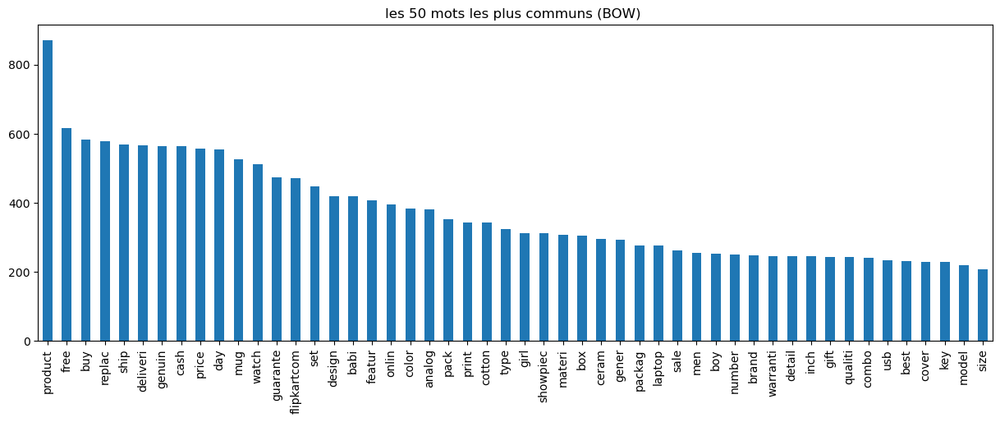

In [188]:
plt.title('les 50 mots les plus communs (BOW) ')
bow_df.sum(axis=0).sort_values(ascending=False)[:50].plot.bar(figsize=(15,5))
plt.show()

### Transformation en matrice TF-IDF

Le Term frequency-inverse document frequency (TF-IDF) est un modèle qui pondère les mots compte par une mesure de la fréquence à laquelle elles apparaissent dans le corpus. Il s'agit d'un statistique numérique destiné à refléter l'importance d'un mot ; c'est comme un facteur de pondération.

La valeur TF-IDF augmente proportionnellement au nombre de fois qu'un mot apparaît dans le corpus et est compensée par le nombre de documents dans le corpus qui contiennent le mot, ce qui permet d'ajuster le fait que certains mots apparaissent plus fréquemment en général.

In [189]:
tfidf = TfidfVectorizer()
tfidf_vect = tfidf.fit_transform(products_text_data['clean_text']).toarray()
tfidf_vect.shape

(1050, 4449)

In [190]:
# Dataframe in TF-IDF form
tokens = tfidf.get_feature_names()
tfidf_df = pd.DataFrame(tfidf_vect, columns=tokens)
print(tfidf_df.shape)

(1050, 4449)


C:\Users\yosra\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



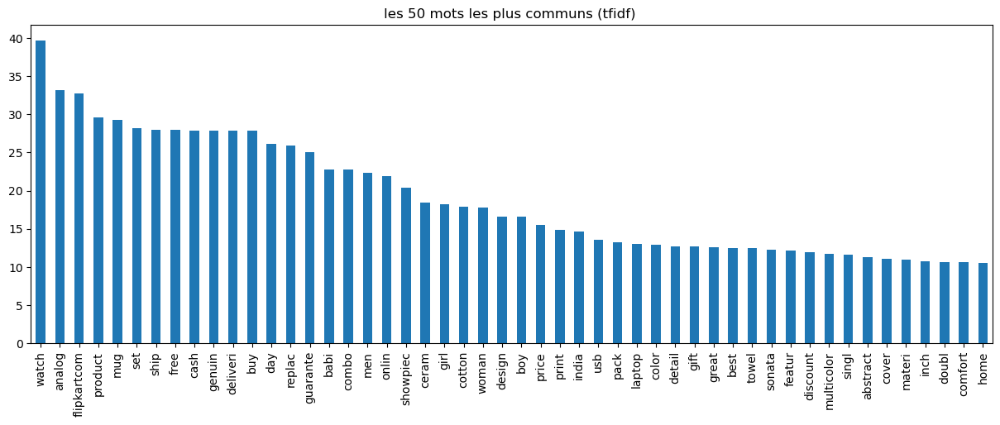

In [191]:
plt.title('les 50 mots les plus communs (tfidf) ')
tfidf_df.sum(axis=0).sort_values(ascending=False)[:50].plot.bar(figsize=(15,5))
plt.show()

## 4. REDUCTION DE DIMENSION

On va utiliser 2 techniques :

- Analyse en Composantes Principales (ACP)
- t-distributed stochastic neighbor embedding (t-SNE)

# 4.1.PCA

La réduction PCA permet de créer des features décorrélées entre elles, et de diminuer leur dimension, tout en gardant un niveau de variance expliquée élevé (99% dans notre cas)

## 4.1.1.BOW

In [192]:
from sklearn import cluster ,manifold, decomposition ,preprocessing ,metrics

In [193]:
print("Dimensions dataset avant réduction PCA : ", bow_vect.shape)
pca = decomposition.PCA(n_components=0.99)
pca_results_bow= pca.fit_transform(bow_vect)
print("Dimensions dataset après réduction PCA : ", pca_results_bow.shape)

Dimensions dataset avant réduction PCA :  (1050, 4449)
Dimensions dataset après réduction PCA :  (1050, 696)


## 4.1.2.TF-IDF

In [194]:
print("Dimensions dataset avant réduction PCA : ", tfidf_vect.shape)
pca = decomposition.PCA(n_components=0.99)
pca_results_tfidf= pca.fit_transform(tfidf_vect)
print("Dimensions dataset après réduction PCA : ", pca_results_tfidf.shape)

Dimensions dataset avant réduction PCA :  (1050, 4449)
Dimensions dataset après réduction PCA :  (1050, 825)


# 4.2.TSNE

## 4.2.1.BOW

## Réduction de dimension en 2 composantes T-SNE pour affichage en 2D des textes

In [195]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_bow = tsne.fit_transform(pca_results_bow)

df_tsne_bow = pd.DataFrame(tsne_results_bow[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_bow["class"] = products_text_data["category"]
print(df_tsne_bow.shape)

C:\Users\yosra\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



(1050, 3)


### Visualisation

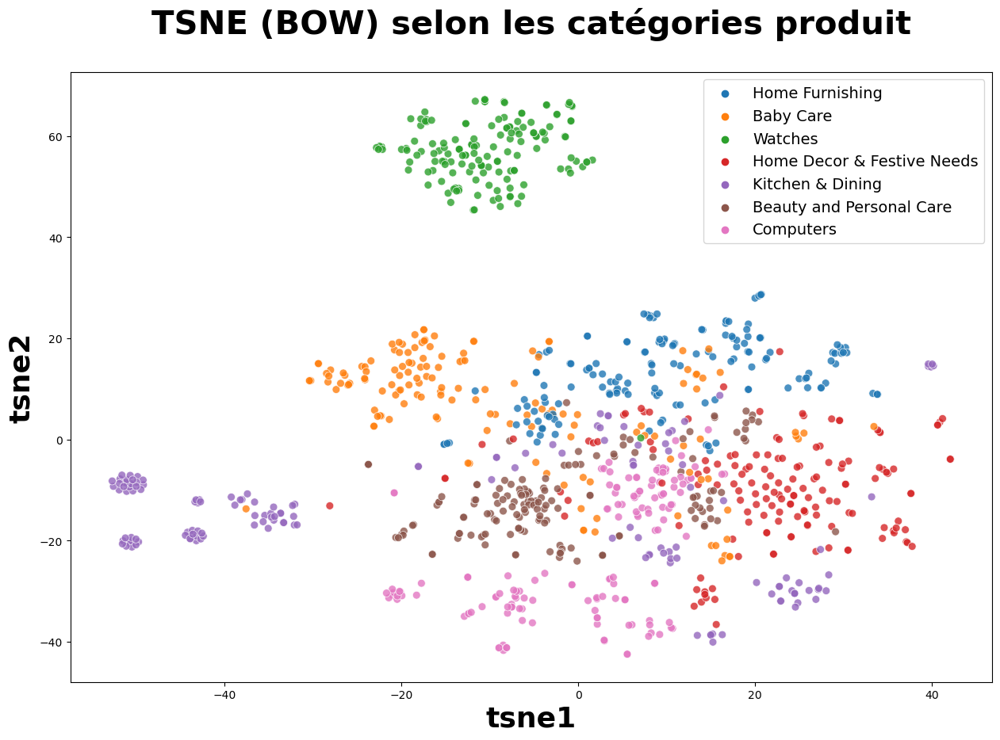

In [196]:
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_bow, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (BOW) selon les catégories produit', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()


## 4.2.2.TF-IDF

In [197]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_tfidf = tsne.fit_transform(pca_results_tfidf)

df_tsne_tfidf = pd.DataFrame(tsne_results_tfidf[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_tfidf["class"] = products_text_data["category"]
print(df_tsne_tfidf.shape)

C:\Users\yosra\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



(1050, 3)


### Visualisation

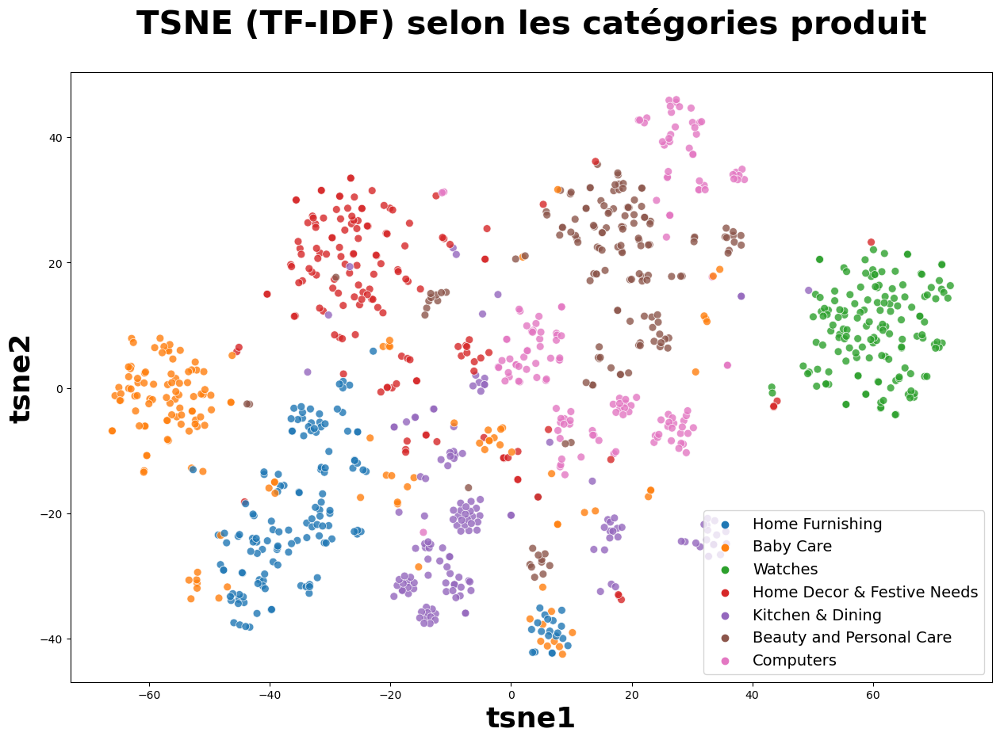

In [198]:
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_tfidf, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (TF-IDF) selon les catégories produit', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

# 5.CLUSTERING
## K-Means classification

In [199]:
df_resultats = pd.DataFrame()

def add_model_score(df: pd.DataFrame = None, model_name: str = 'none', ARI: float = 0, **kwargs):
    global df_resultats
    if df is None:
        df = df_resultats
    """ajout les resultats d'un model """
    resultats = dict(model=model_name, ARI=ARI)
    resultats = dict(**resultats, **kwargs)
    df = df.append(resultats, ignore_index=True)
    return df

In [200]:
# On a 7 catégories produit
N_CLUSTERS = 7 

###  5.1.BOW

In [201]:
from sklearn.metrics import silhouette_score


In [202]:
#Création de clusters à partir du T-SNE 
X = df_tsne_bow[["tsne1","tsne2"]]

cls = KMeans(n_clusters=N_CLUSTERS, init='k-means++', random_state=0)
cls.fit(X)

df_tsne_bow["cluster"] = cls.labels_

sil = silhouette_score(X,cls.labels_,metric="euclidean")
print("========================================")
print("Le score de silhouette est",round( sil,2))
print("========================================")

Le score de silhouette est 0.45


### Calcul du Score ARI

* Pour mesurer l'erreur de notre moteur de classification, nous allons utiliser la métrique ARI via la fonction adjusted_rand_score de sklearn.

* L'adjusted_rand_score calcule une mesure de similarité entre deux groupements en considérant toutes les paires d'échantillons et en comptant les paires qui sont assignées dans le même groupement ou dans des groupements différents dans les groupements prédits et réels.

* Le score ARI va de 0 pour un étiquetage aléatoire à 1 pour un étiquetage parfait.

In [203]:
# Création des labels à partir du nom de catégorie produit
le = preprocessing.LabelEncoder()
products_text_data["label"] = le.fit_transform(products_text_data["category"])
le_name_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print(le_name_mapping)

{'Baby Care': 0, 'Beauty and Personal Care': 1, 'Computers': 2, 'Home Decor & Festive Needs': 3, 'Home Furnishing': 4, 'Kitchen & Dining': 5, 'Watches': 6}


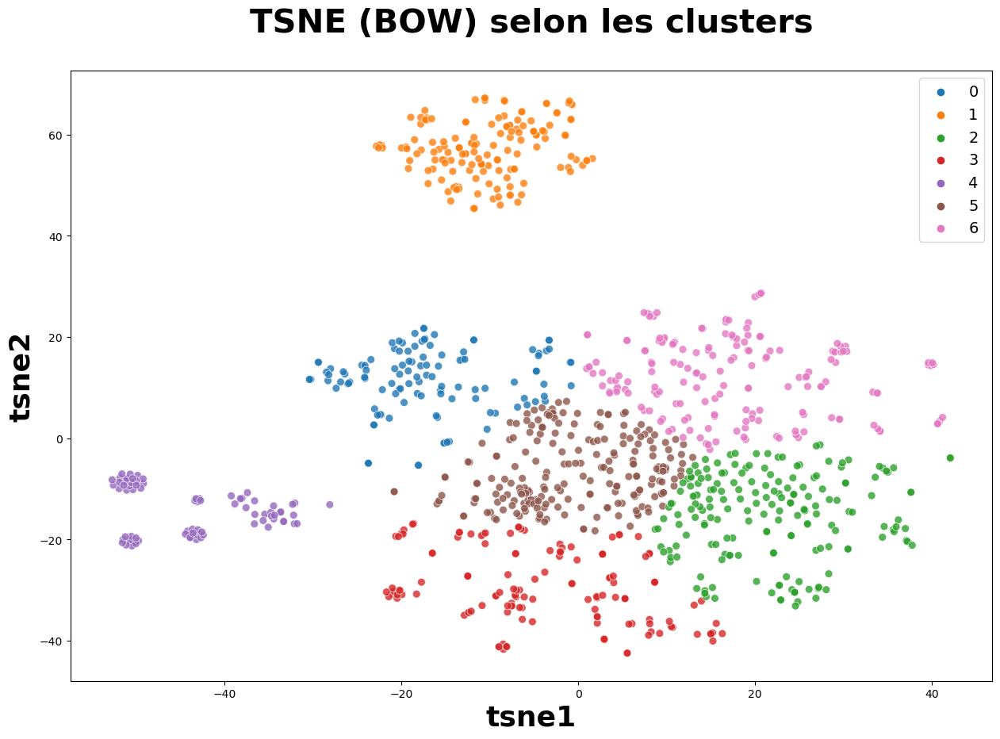

ARI  :  0.4201891957096041


In [204]:
#Affichage des images selon clusters et calcul ARI de similarité catégories produit / clusters
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
    data=df_tsne_bow,
    legend="brief")

plt.title('TSNE (BOW) selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

labels = products_text_data["label"]
print("ARI  : ", metrics.adjusted_rand_score(labels, cls.labels_))

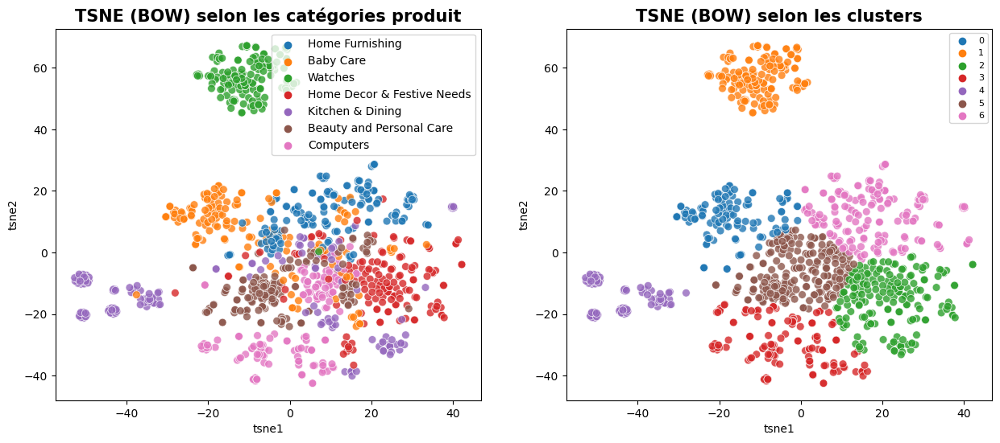

ARI :  0.42


C:\Users\yosra\AppData\Local\Temp\ipykernel_11672\3059067803.py:10: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [205]:
fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(121)
    
sns.scatterplot(
x="tsne1", y="tsne2", hue="class", data=df_tsne_bow, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (BOW) selon les catégories produit', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1' )
plt.ylabel('tsne2')
plt.legend(prop={'size': 10}) 


ax = fig.add_subplot(122)
sns.scatterplot(
x="tsne1", y="tsne2",
hue="cluster",
palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
data=df_tsne_bow,
legend="brief")

plt.title('TSNE (BOW) selon les clusters', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 

plt.show()
ARI_bow=round( metrics.adjusted_rand_score(labels, cls.labels_),3)
labels = products_text_data["label"]
print(f"ARI : ",ARI_bow)
df_resultats = add_model_score(
    model_name='BOW ', ARI=ARI_bow)

In [206]:
df_resultats

,model,ARI
0,BOW,0.42


In [207]:
# Fonction pour afficher la répartition des vraies catégories par cluster

def plot_clust_vs_cat(ser_clust, ser_cat, data, figsize=(8,4),
                                  palette='tab10', ylim=(0,250),
                                  bboxtoanchor=None):
    
    # pivot = data.drop(columns=['description','image'])
    pivot = pd.DataFrame()
    pivot['label']=ser_clust
    pivot['category']=ser_cat
    pivot['count']=1
    pivot = pivot.groupby(by=['label','category']).count().unstack().fillna(0)
    pivot.columns=pivot.columns.droplevel()
    
    colors = sns.color_palette(palette, ser_clust.shape[0]).as_hex()
    pivot.plot.bar(width=0.8,stacked=True,legend=True,figsize=figsize,
                   color=colors, ec='k')

    row_data=data.shape[0]

    if ser_clust.nunique() > 15:
        font = 8 
    else : 
        font = 12

    for index, value in enumerate(ser_clust.value_counts().sort_index(ascending=True)):
        percentage = np.around(value/row_data*100,1)   
        plt.text(index-0.25, value+2, str(percentage)+' %',fontsize=font)

    plt.gca().set(ylim=ylim)
    plt.xticks(rotation=0) 

    plt.xlabel('Clusters',fontsize=14)
    plt.ylabel('Nombre de produits', fontsize=14)
    plt.title('Répartition des vraies catégories par cluster',
              fontweight='bold', fontsize=18)

    if bboxtoanchor is not None:
        plt.legend(bbox_to_anchor=bboxtoanchor)
        
    plt.show()    
    
    return pivot

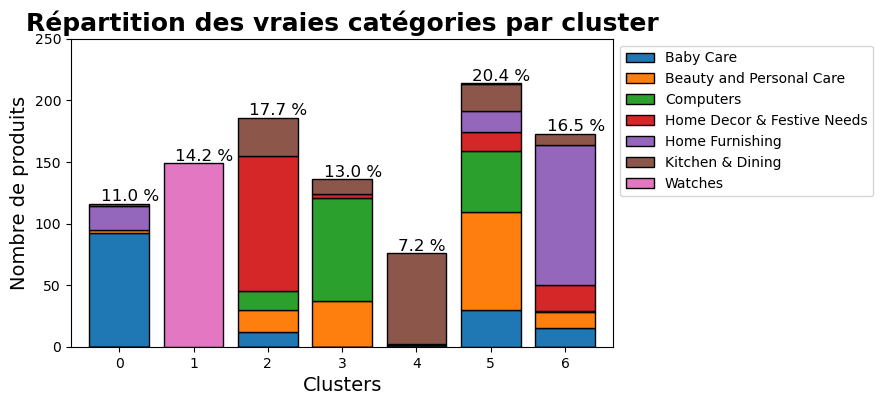

category,Baby Care,Beauty and Personal Care,Computers,Home Decor & Festive Needs,Home Furnishing,Kitchen & Dining,Watches
label,,,,,,,
0,92.0,3.0,0.0,0.0,19.0,2.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,149.0
2,12.0,18.0,15.0,110.0,0.0,31.0,0.0
3,0.0,37.0,84.0,3.0,0.0,12.0,0.0
4,1.0,0.0,0.0,1.0,0.0,74.0,0.0
5,30.0,79.0,50.0,15.0,17.0,22.0,1.0
6,15.0,13.0,1.0,21.0,114.0,9.0,0.0


In [208]:
plot_clust_vs_cat(df_tsne_bow["cluster"],
                              df_tsne_bow["class"],
                              df_tsne_bow,   
                              palette='tab10',
                              figsize=(7,4),
                              bboxtoanchor=(1,1), ylim=(0,250))

In [209]:
# Affiche la matrice de confusion

def confusion_matrix(y_true, y_pred, title):
    """ xxx
    Args:
        y_true list(str):
        y_pred list(int):
        title (str): 
    Returns:
        -
    """
    # Create a DataFrame with labels and varieties as columns: df
    df = pd.DataFrame({'Labels': y_true, 'Clusters': y_pred})

    # Create crosstab: ct
    ct = pd.crosstab(df['Labels'], df['Clusters'])

    # plot the heatmap for correlation matrix
    fig, ax = plt.subplots(figsize=(10, 8))

    sns.heatmap(ct.T, 
                 square=True, 
                 annot=True, 
                 annot_kws={"size": 17},
                 fmt='.2f',
                 cmap='Blues',
                 cbar=False,
                 ax=ax)

    ax.set_title(title, fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=12)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, ha="right", fontsize=12)
    ax.set_ylabel("clusters", fontsize=15)
    ax.set_xlabel("labels", fontsize=15)

    plt.show()

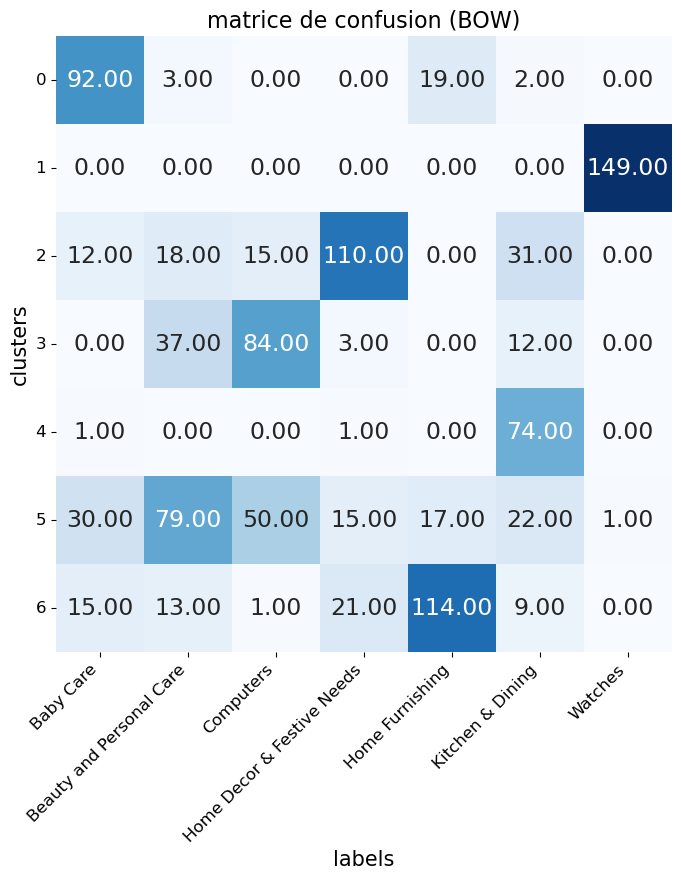

In [210]:
confusion_matrix(df_tsne_bow["class"], df_tsne_bow["cluster"], 'matrice de confusion (BOW)')

### TF-IDF

In [211]:
#Création de clusters à partir du T-SNE 
X = df_tsne_tfidf[["tsne1","tsne2"]]

cls_tfidf = KMeans(n_clusters=N_CLUSTERS, init='k-means++')
cls_tfidf.fit(X)

df_tsne_tfidf["cluster"] = cls_tfidf.labels_

sil = silhouette_score(X,cls_tfidf.labels_,metric="euclidean")
print("Le score de silhouette est",round( sil,2))

Le score de silhouette est 0.49


In [212]:
df_tsne_tfidf.head(7)


,tsne1,tsne2,class,cluster
0,-34.587612,-4.838781,Home Furnishing,5
1,7.171058,-40.429840,Baby Care,1
2,5.257200,-37.728901,Baby Care,1
3,-37.663071,-15.558870,Home Furnishing,5
4,-38.237556,-15.658433,Home Furnishing,5
5,68.564667,10.510234,Watches,0
6,62.934635,12.200620,Watches,0


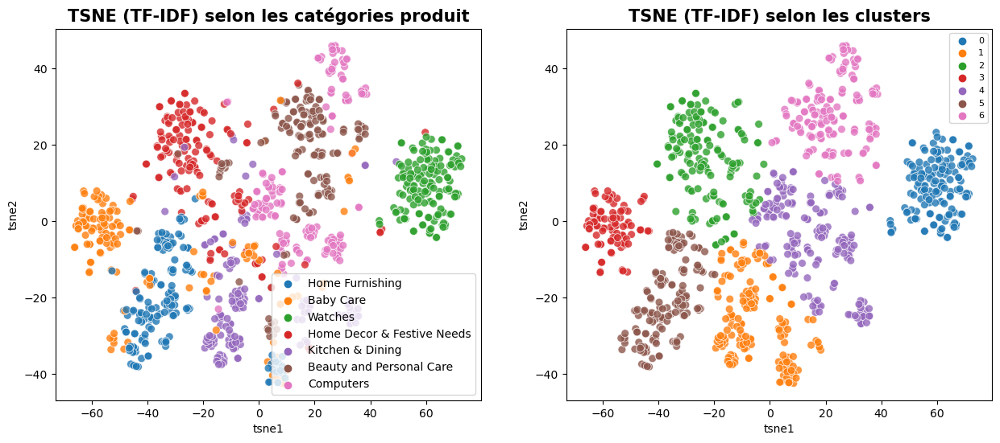

ARI :  0.532


C:\Users\yosra\AppData\Local\Temp\ipykernel_11672\3059067803.py:10: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [213]:
fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(121)
    
sns.scatterplot(
x="tsne1", y="tsne2", hue="class", data=df_tsne_tfidf, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (TF-IDF) selon les catégories produit', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1' )
plt.ylabel('tsne2')
plt.legend(prop={'size': 10}) 


ax = fig.add_subplot(122)
sns.scatterplot(
x="tsne1", y="tsne2",
hue="cluster",
palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
data=df_tsne_tfidf,
legend="brief")

plt.title('TSNE (TF-IDF) selon les clusters', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 

plt.show()
ARI_tf_idf=round( metrics.adjusted_rand_score(labels, cls_tfidf.labels_),3)
labels = products_text_data["label"]
print(f"ARI : ",ARI_tf_idf)
df_resultats = add_model_score(
    model_name='TF-IDF ', ARI=ARI_tf_idf)


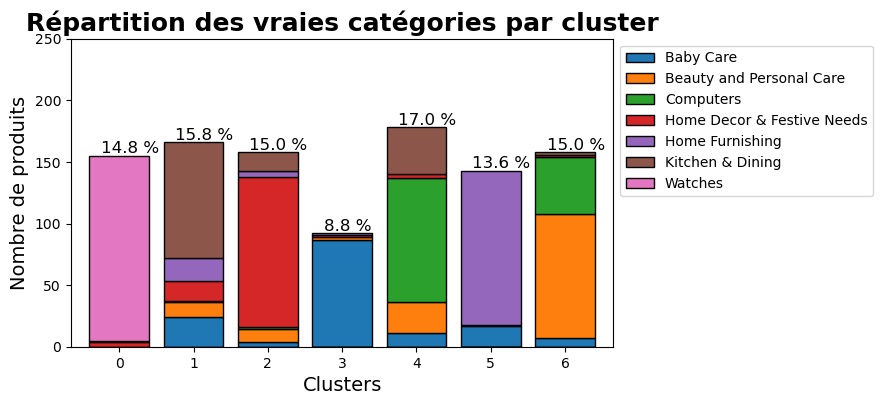

category,Baby Care,Beauty and Personal Care,Computers,Home Decor & Festive Needs,Home Furnishing,Kitchen & Dining,Watches
label,,,,,,,
0,0.0,0.0,0.0,4.0,0.0,1.0,150.0
1,24.0,12.0,1.0,16.0,19.0,94.0,0.0
2,4.0,10.0,2.0,122.0,5.0,15.0,0.0
3,87.0,2.0,0.0,2.0,1.0,0.0,0.0
4,11.0,25.0,101.0,3.0,0.0,38.0,0.0
5,17.0,0.0,0.0,1.0,125.0,0.0,0.0
6,7.0,101.0,46.0,2.0,0.0,2.0,0.0


In [214]:
plot_clust_vs_cat(df_tsne_tfidf["cluster"],
                              df_tsne_tfidf["class"],
                              df_tsne_tfidf,   
                              palette='tab10',
                              figsize=(7,4),
                              bboxtoanchor=(1,1), ylim=(0,250))

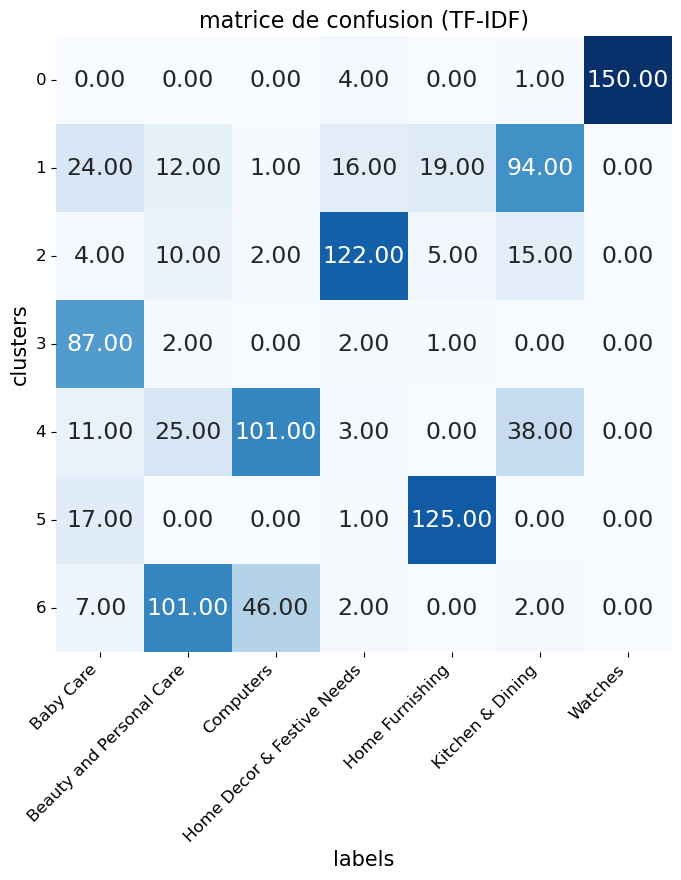

In [215]:
confusion_matrix(df_tsne_tfidf["class"], df_tsne_tfidf["cluster"], 'matrice de confusion (TF-IDF)')

## Approche de type word embedding : Word2Vec

Méthode Word2Vec

- Word2vec est un groupe de modèles utilisé pour le plongement lexical (word embedding).
Ces modèles ont été développés par une équipe de recherche chez Google sous la direction de Tomas Mikolov. 
Ce sont des réseaux de neurones artificiels à deux couches entraînés pour reconstruire le contexte linguistique des mots. 
- La méthode est implémentée dans la bibliothèque Python Gensim.

In [216]:
import gensim

In [217]:
w2v_size=300
w2v_window=5
w2v_min_count=1
w2v_epochs=100
maxlen = 24 # adapt to length of sentences
sentences = products_text_data['clean_text'].to_list()
sentences = [gensim.utils.simple_preprocess(text) for text in sentences]

In [218]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count=w2v_min_count, window=w2v_window,
                                                vector_size=w2v_size,
                                                seed=42,
                                                workers=1)
#                                                
w2v_model.build_vocab(sentences)
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 4399
Word2Vec trained


In [219]:
import tensorflow as tf
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import gensim

In [ ]:
#!pip install keras==2.9

In [ ]:
#tensorflow version:          2.8.2
#keras version:               2.8.0
#numpy version:               1.21.6
#cv2 version:                 4.6.0
#segmentation_models version: 1.0.1
#python version:              3.7.14

In [221]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                                                     maxlen=maxlen,
                                                     padding='post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 4400


In [222]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
w2v_size = 300
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  1.0
Embedding matrix: (4400, 300)


In [223]:
def creer_vecteur_moyen_par_mot(data, text_dim, w2v_model):

    vect_moy = np.zeros((text_dim,), dtype='float32')
    num_words = 0.

    for word in data.split():
        if word in w2v_model.wv.vocab:
            vect_moy = np.add(vect_moy, w2v_model[word])
            num_words += 1.

    if num_words != 0.:
        vect_moy = np.divide(vect_moy, num_words)

    return vect_moy

In [224]:
# Création du modèle d'embedding

input=Input(shape=(len(x_sentences),maxlen),dtype='float64')
word_input=Input(shape=(maxlen,),dtype='float64')  
word_embedding=Embedding(input_dim=vocab_size,
                         output_dim=w2v_size,
                         weights = [embedding_matrix],
                         input_length=maxlen)(word_input)
word_vec=GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 24)]              0         
                                                                 
 embedding (Embedding)       (None, 24, 300)           1320000   
                                                                 
 global_average_pooling1d (G  (None, 300)              0         
 lobalAveragePooling1D)                                          
                                                                 
Total params: 1,320,000
Trainable params: 1,320,000
Non-trainable params: 0
_________________________________________________________________


In [225]:
embeddings = embed_model.predict(x_sentences)
embeddings.shape

33/33 [==============================] - 0s 2ms/step


(1050, 300)

### Réduction de dimension

### ACP

In [226]:
print("Dimensions dataset avant réduction PCA : ", embeddings.shape)
pca = decomposition.PCA(n_components=0.99)
pca_results_word2vec= pca.fit_transform(embeddings)
print("Dimensions dataset après réduction PCA : ", pca_results_word2vec.shape)

Dimensions dataset avant réduction PCA :  (1050, 300)
Dimensions dataset après réduction PCA :  (1050, 61)


### T_SNE

In [227]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_word2vec = tsne.fit_transform(pca_results_word2vec)

df_tsne_word2vec = pd.DataFrame(tsne_results_word2vec[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_word2vec["class"] = products_text_data["category"]

print(df_tsne_word2vec.shape)

C:\Users\yosra\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



(1050, 3)


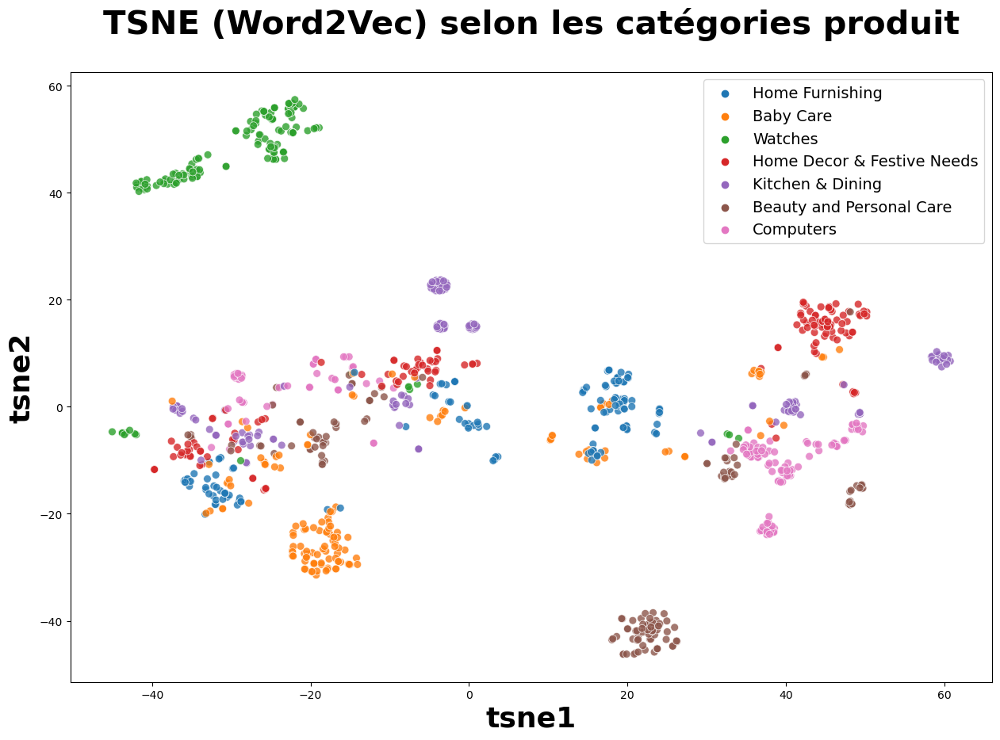

In [228]:
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_word2vec, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (Word2Vec) selon les catégories produit', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

In [229]:
#Création de clusters à partir du T-SNE 
X = df_tsne_word2vec[["tsne1","tsne2"]]

cls_Word2Vec = KMeans(n_clusters=N_CLUSTERS, init='k-means++', random_state=0)
cls_Word2Vec.fit(X)

df_tsne_word2vec["cluster"] = cls_Word2Vec.labels_

sil = np.round(silhouette_score(X,cls_Word2Vec.labels_,metric="euclidean"),2)
print("====================================================")
print("Le score de silhouette est", sil)
print("====================================================")

Le score de silhouette est 0.56


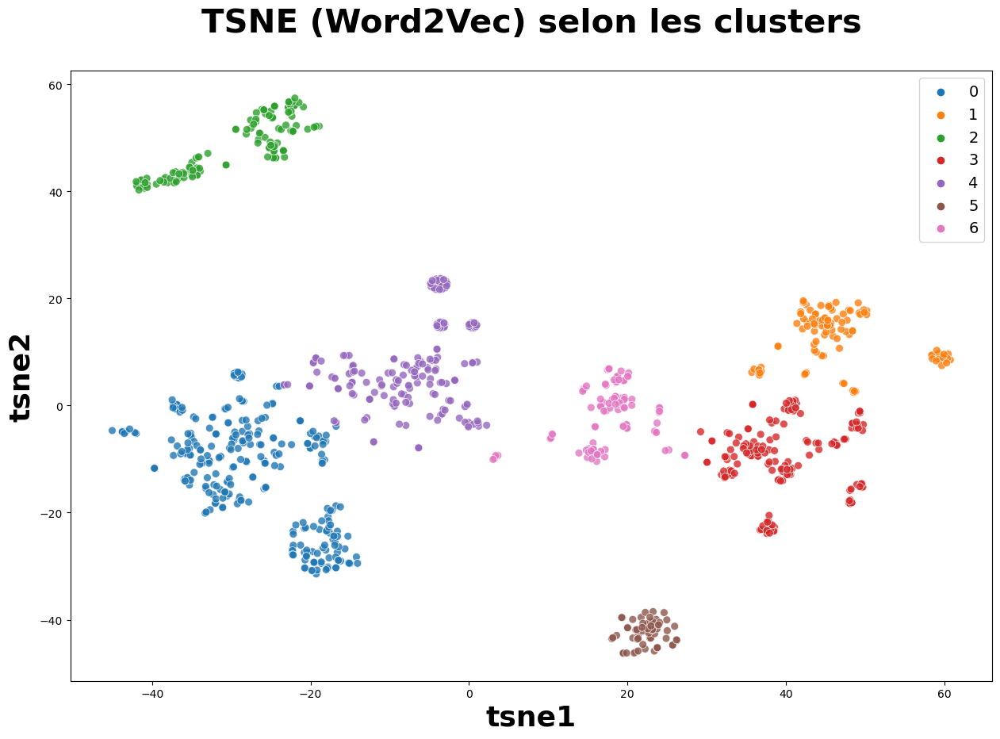

ARI :  0.279


In [230]:
#Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
    data=df_tsne_word2vec,
    legend="brief")

plt.title('TSNE (Word2Vec) selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()
ARI_Word2Vec=np.round(metrics.adjusted_rand_score(labels, cls_Word2Vec.labels_),3)
labels = products_text_data["label"]
print("====================================================")
print("ARI : ",ARI_Word2Vec)
print("====================================================")

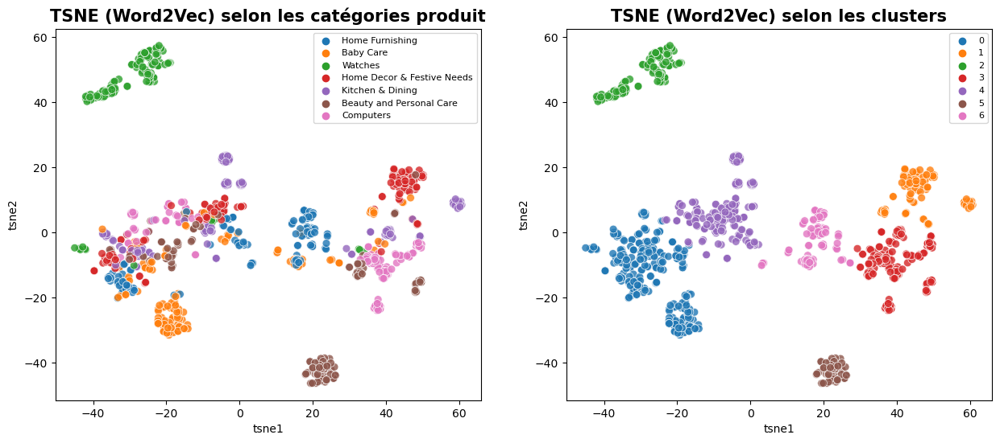

ARI :  0.279


C:\Users\yosra\AppData\Local\Temp\ipykernel_11672\3059067803.py:10: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [231]:
fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(121)
    
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_word2vec, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (Word2Vec) selon les catégories produit', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 


ax = fig.add_subplot(122)
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
    data=df_tsne_word2vec,
    legend="brief")

plt.title('TSNE (Word2Vec) selon les clusters', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 

plt.show()


ARI_Word2Vec=np.round(metrics.adjusted_rand_score(labels, cls_Word2Vec.labels_),3)

print("====================================================")
print("ARI : ",ARI_Word2Vec)
print("====================================================")
df_resultats = add_model_score(
    model_name='Word2Vec ', ARI=ARI_Word2Vec)


In [232]:
df_tsne_word2vec.groupby("cluster").count()["class"]

cluster
0    289
1    110
2    131
3    167
4    187
5     62
6    104
Name: class, dtype: int64

### Répartition des vraies catégories par cluster

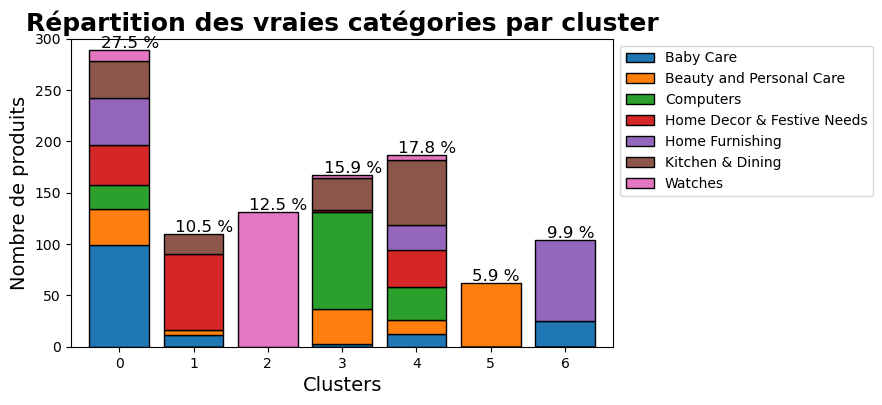

category,Baby Care,Beauty and Personal Care,Computers,Home Decor & Festive Needs,Home Furnishing,Kitchen & Dining,Watches
label,,,,,,,
0,99.0,35.0,24.0,38.0,46.0,36.0,11.0
1,11.0,5.0,0.0,74.0,0.0,20.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,131.0
3,3.0,34.0,94.0,2.0,0.0,31.0,3.0
4,12.0,14.0,32.0,36.0,25.0,63.0,5.0
5,0.0,62.0,0.0,0.0,0.0,0.0,0.0
6,25.0,0.0,0.0,0.0,79.0,0.0,0.0


In [233]:
plot_clust_vs_cat(df_tsne_word2vec["cluster"],
                              df_tsne_word2vec["class"],
                              df_tsne_word2vec,   
                              palette='tab10',
                              figsize=(7,4),
                              bboxtoanchor=(1,1), ylim=(0,300))

### Matrice de confusion (WORD2VEC)

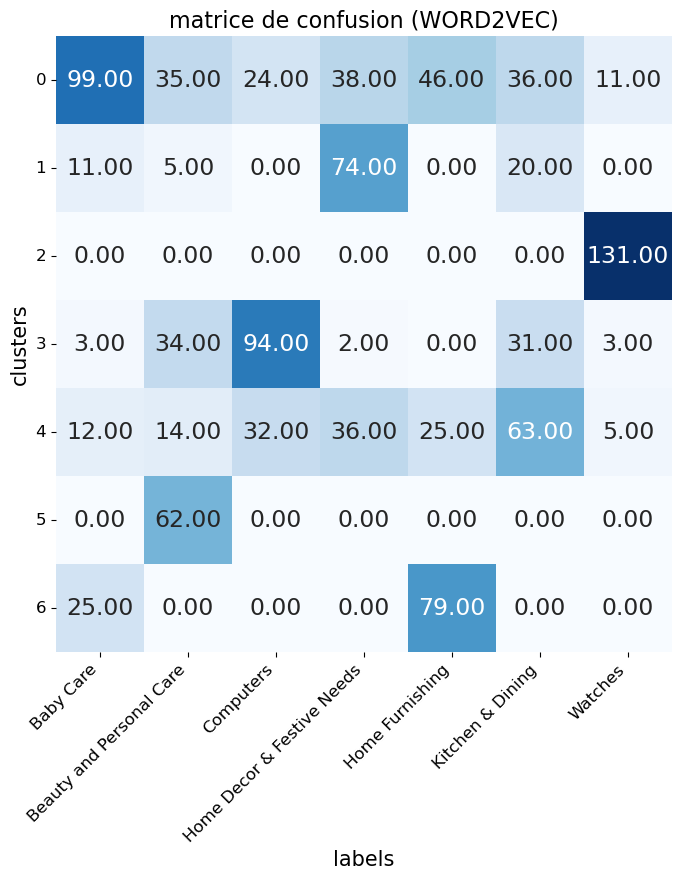

In [234]:
confusion_matrix(df_tsne_word2vec['class'], df_tsne_word2vec['cluster'], 'matrice de confusion (WORD2VEC)')

## Approche de type word embedding : BERT et Approche de type sentence embedding : USE (Universal Sentence Encoder)

## Création de feature sentence_dl pour deep learning
Les modèles de deep learning comme BERT et USE traitent les mots dans le contexte de leurs phrases

- BERT : Bidirectional Encoder Representations from Transformers
- USE : Universal Sentence Encoder

Avec BERT et USE, il ne faut pas trop traiter les textes, sinon, on perdre le contexte (racine, lemmatisation) ou modifier purement et simplement les textes (suppression des mots vides).

Les descriptions des produits semblent déjà traités, donc on essaie d'eviter de supprimer les stopwords et lemmatization.

In [235]:
# lower case et alpha
def lower_start_fct(list_words) :
    lw = [w.lower() for w in list_words if (not w.startswith("@")) 
    #                                   and (not w.startswith("#"))
                                       and (not w.startswith("http"))]
    return lw

# Fonction de préparation du texte pour le Deep learning (USE et BERT)
def transform_dl_fct(desc_text) :
    lw = lower_start_fct(desc_text)
    # lem_w = lemma_fct(lw)    
    transf_desc_text = ' '.join(lw)
    return transf_desc_text

In [236]:
products_text_data['sentence_dl'] = products_text_data['net_tokens'].apply(lambda x : transform_dl_fct(x))
products_text_data.head(3)

,uniq_id,category,description,description_nopunc,description_nodg,token,tokens,net_tokens,stem_words,lem_words,clean_text,label,sentence_dl
0,55b85ea15a1536d46b7190ad6fff8ce7,Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance Polyester Multicolor Abstract Eyelet ...,"[elegance, polyester, multicolor, abstract, ey...","[elegance, polyester, multicolor, abstract, ey...","[elegance, polyester, multicolor, abstract, ey...","[eleg, polyest, multicolor, abstract, eyelet, ...","[eleg, polyest, multicolor, abstract, eyelet, ...",eleg polyest multicolor abstract eyelet door c...,4,elegance polyester multicolor abstract eyelet ...
1,7b72c92c2f6c40268628ec5f14c6d590,Baby Care,Sathiyas Cotton Bath Towel Sathiyas Specificat...,Sathiyas Cotton Bath Towel Sathiyas Specificat...,Sathiyas Cotton Bath Towel Sathiyas Specificat...,"[sathiyas, cotton, bath, towel, sathiyas, spec...","[sathiyas, cotton, bath, towel, sathiyas, spec...","[sathiyas, cotton, bath, towel, sathiyas, spec...","[sathiya, cotton, bath, towel, sathiya, specif...","[sathiya, cotton, bath, towel, sathiya, specif...",sathiya cotton bath towel sathiya specif sathi...,0,sathiyas cotton bath towel sathiyas specificat...
2,64d5d4a258243731dc7bbb1eef49ad74,Baby Care,Eurospa Cotton Terry Face Towel Set Eurospa Ke...,Eurospa Cotton Terry Face Towel Set Eurospa Ke...,Eurospa Cotton Terry Face Towel Set Eurospa Ke...,"[eurospa, cotton, terry, face, towel, set, eur...","[eurospa, cotton, terry, face, towel, set, eur...","[eurospa, cotton, terry, face, towel, set, eur...","[eurospa, cotton, terri, face, towel, set, eur...","[eurospa, cotton, terri, face, towel, set, eur...",eurospa cotton terri face towel set eurospa ke...,0,eurospa cotton terry face towel set eurospa ke...


In [237]:
df_bert_use=products_text_data[['category','sentence_dl']].copy()
df_bert_use.head(5)

,category,sentence_dl
0,Home Furnishing,elegance polyester multicolor abstract eyelet ...
1,Baby Care,sathiyas cotton bath towel sathiyas specificat...
2,Baby Care,eurospa cotton terry face towel set eurospa ke...
3,Home Furnishing,santosh royal fashion cotton printed king size...
4,Home Furnishing,jaipur print cotton floral king sized double b...


In [238]:
df_bert_use['length_dl'] = df_bert_use['sentence_dl'].apply(lambda x : len(word_tokenize(x)))
print("max length dl : ", df_bert_use['length_dl'].max())

max length dl :  359


In [239]:
# Fonction de préparation des sentences
def bert_inp_fct(sentences, bert_tokenizer, max_length) :
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    for sent in sentences:
        bert_inp = bert_tokenizer.encode_plus(sent,
                                              add_special_tokens = True,
                                              max_length = max_length,
                                              padding='max_length',
                                              return_attention_mask = True, 
                                              return_token_type_ids=True,
                                              truncation=True,
                                              return_tensors="tf")
    
        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])
        bert_inp_tot.append((bert_inp['input_ids'][0], 
                             bert_inp['token_type_ids'][0], 
                             bert_inp['attention_mask'][0]))

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    
    return input_ids, token_type_ids, attention_mask, bert_inp_tot
    

# Fonction de création des features
def feature_BERT_fct(model, model_type, sentences, max_length, b_size, mode='HF') :
    batch_size = b_size
    batch_size_pred = b_size
    bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        input_ids, token_type_ids, attention_mask, bert_inp_tot = bert_inp_fct(sentences[idx:idx+batch_size], 
                                                                      bert_tokenizer, max_length)
        
        if mode=='HF' :    # Bert HuggingFace
            outputs = model.predict([input_ids, attention_mask, token_type_ids], batch_size=batch_size_pred)
            last_hidden_states = outputs.last_hidden_state

        if mode=='TFhub' : # Bert Tensorflow Hub
            text_preprocessed = {"input_word_ids" : input_ids, 
                                 "input_mask" : attention_mask, 
                                 "input_type_ids" : token_type_ids}
            outputs = model(text_preprocessed)
            last_hidden_states = outputs['sequence_output']
             
        if step ==0 :
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
        else :
            last_hidden_states_tot = np.concatenate((last_hidden_states_tot,last_hidden_states))
    
    features_bert = np.array(last_hidden_states_tot).mean(axis=1)
    
    time2 = np.round(time.time() - time1,0)
    print("temps traitement : ", time2)
     
    return features_bert, last_hidden_states

### BERT HuggingFace
#### Model 'bert-base-uncased'

In [240]:
import transformers
from transformers import TFAutoModel

In [241]:
max_length = 64
batch_size = 10
model_type = 'bert-base-uncased'
model = transformers.TFAutoModel.from_pretrained(model_type)
sentences = df_bert_use['sentence_dl'].to_list()

C:\Users\yosra\anaconda3\lib\site-packages\huggingface_hub\file_download.py:129: UserWarning:

`huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\yosra\.cache\huggingface\hub. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to see activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development



Some layers from the model checkpoint at bert-base-uncased were not used when initializing TFBertModel: ['mlm___cls', 'nsp___cls']
- This IS expected if you are initializing TFBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFBertModel were initialized from the model checkpoint at bert-base-uncased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions without further training.


In [242]:
from transformers import AutoTokenizer
# Création des features
# downloads bert features
features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences,
                                                         max_length, batch_size, mode='HF')

1/1 [==============================] - 3s 3s/step
temps traitement :  554.0


In [243]:
features_bert.shape

(1050, 768)

### REDUCTION DE DIMENSION
### ACP

In [244]:
print("Dimensions dataset avant réduction PCA : ", features_bert.shape)
pca = decomposition.PCA(n_components=0.99)
pca_results_bert= pca.fit_transform(features_bert)
print("Dimensions dataset après réduction PCA : ", pca_results_bert.shape)

Dimensions dataset avant réduction PCA :  (1050, 768)
Dimensions dataset après réduction PCA :  (1050, 342)


### T_SNE

In [245]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_bert = tsne.fit_transform(pca_results_bert)

df_tsne_bert = pd.DataFrame(tsne_results_bert[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_bert["class"] = products_text_data["category"]
print(df_tsne_bert.shape)

C:\Users\yosra\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



(1050, 3)


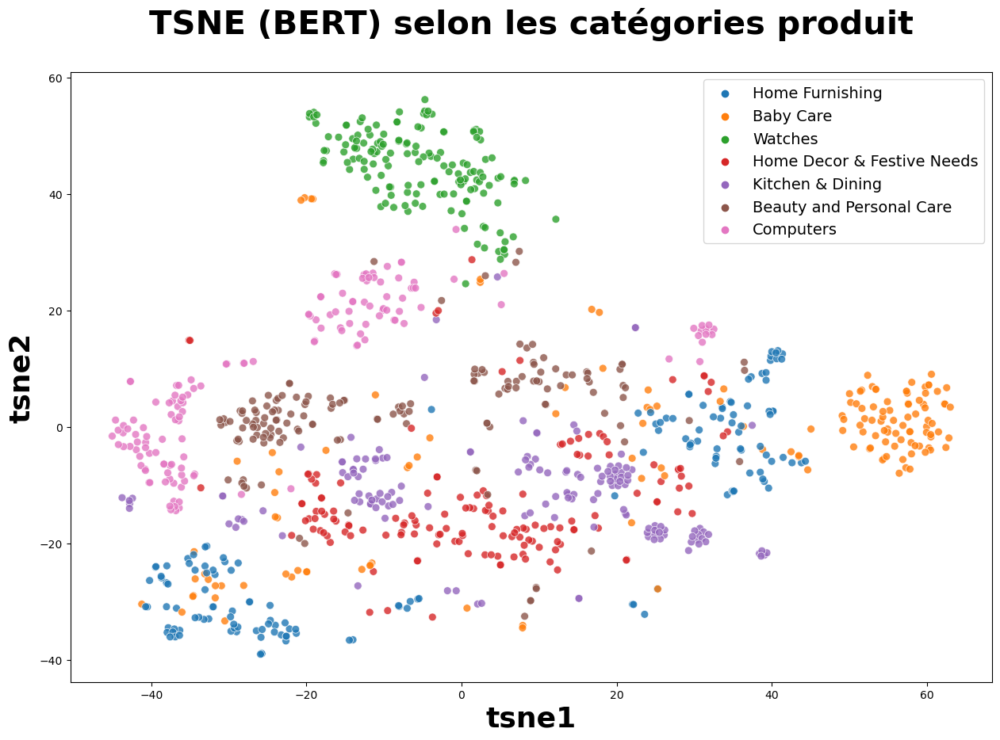

In [246]:
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_bert, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (BERT) selon les catégories produit', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()


In [247]:
#Création de clusters à partir du T-SNE 
X = df_tsne_bert[["tsne1","tsne2"]]

cls_bert = KMeans(n_clusters=N_CLUSTERS, init='k-means++', random_state=0)
cls_bert.fit(X)

df_tsne_bert["cluster"] = cls_bert.labels_

sil = np.round(silhouette_score(X,cls_bert.labels_,metric="euclidean"),2)
print("====================================================")
print("Le score de silhouette est", sil)
print("====================================================")

Le score de silhouette est 0.43


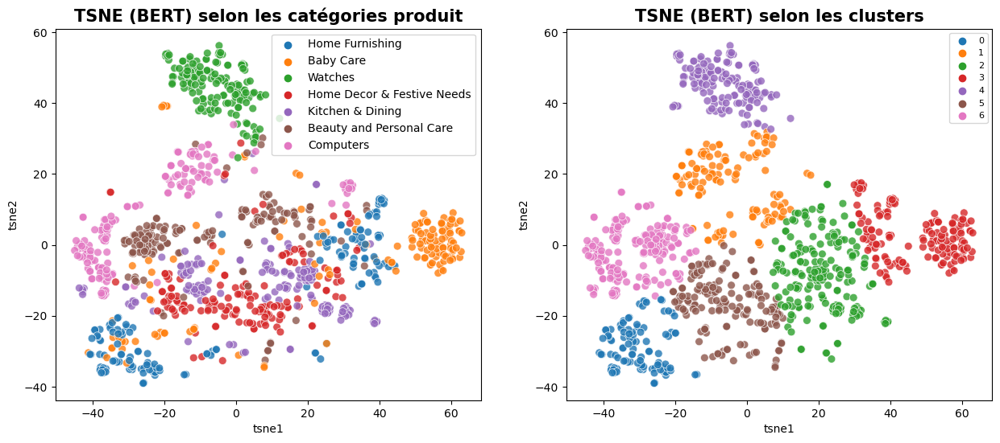

ARI :  0.357


C:\Users\yosra\AppData\Local\Temp\ipykernel_11672\3059067803.py:10: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [248]:
fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(121)
    
sns.scatterplot(
x="tsne1", y="tsne2", hue="class", data=df_tsne_bert, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (BERT) selon les catégories produit', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1' )
plt.ylabel('tsne2')
plt.legend(prop={'size': 10}) 


ax = fig.add_subplot(122)
sns.scatterplot(
x="tsne1", y="tsne2",
hue="cluster",
palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
data=df_tsne_bert,legend="brief")

plt.title('TSNE (BERT) selon les clusters', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 

plt.show()
ARI_bert1 =round( metrics.adjusted_rand_score(labels, cls_bert.labels_),3)
labels = products_text_data["label"]
print("====================================================")
print(f"ARI : ",ARI_bert1 )
print("====================================================")
df_resultats = add_model_score(
    model_name='BERT (bert-base-uncased) ', ARI=ARI_bert1 )


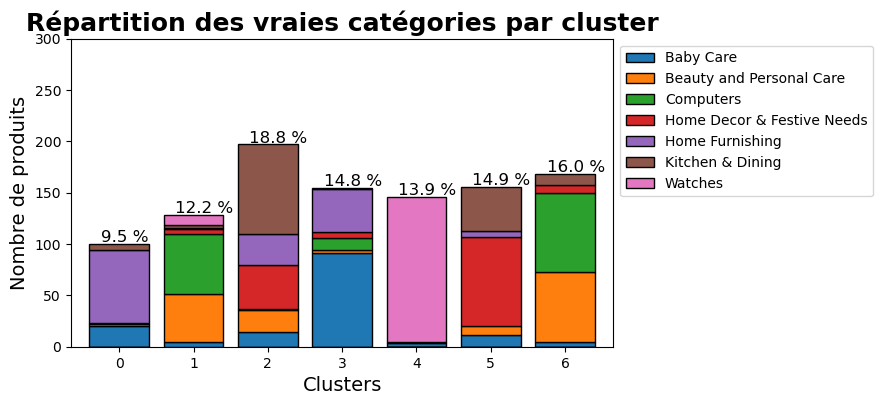

category,Baby Care,Beauty and Personal Care,Computers,Home Decor & Festive Needs,Home Furnishing,Kitchen & Dining,Watches
label,,,,,,,
0,20.0,2.0,0.0,1.0,71.0,6.0,0.0
1,5.0,46.0,59.0,5.0,1.0,3.0,9.0
2,14.0,22.0,1.0,43.0,30.0,87.0,0.0
3,91.0,3.0,12.0,6.0,42.0,1.0,0.0
4,4.0,0.0,1.0,0.0,0.0,0.0,141.0
5,11.0,9.0,0.0,87.0,6.0,43.0,0.0
6,5.0,68.0,77.0,8.0,0.0,10.0,0.0


In [249]:
plot_clust_vs_cat(df_tsne_bert["cluster"],
                              df_tsne_bert["class"],
                              df_tsne_bert,   
                              palette='tab10',
                              figsize=(7,4),
                              bboxtoanchor=(1,1), ylim=(0,300))

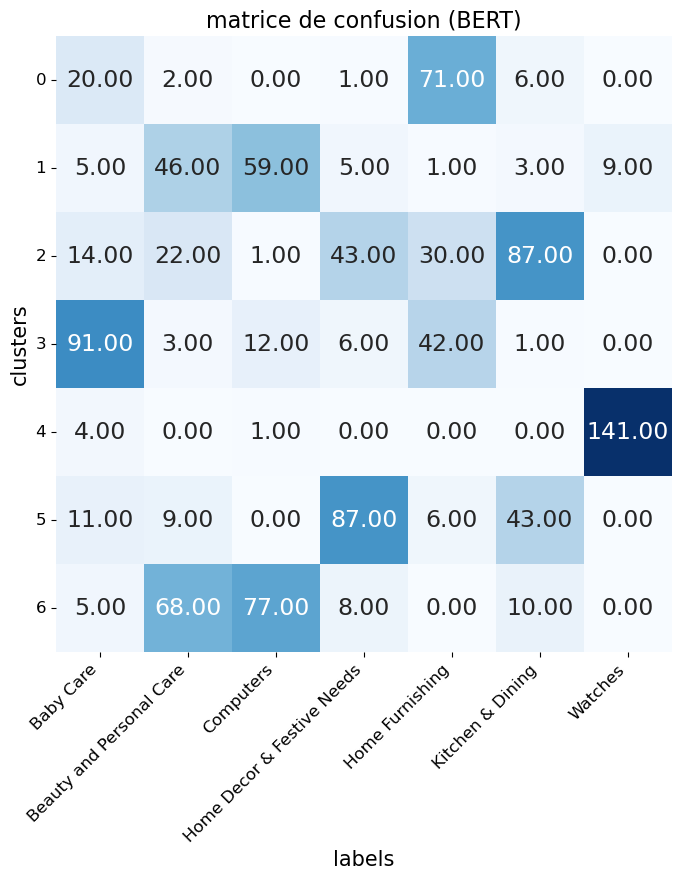

In [250]:
confusion_matrix(df_tsne_bert["class"], df_tsne_bert["cluster"], 'matrice de confusion (BERT)')


### BERT hub Tensorflow

In [251]:
#!pip install --upgrade tensorflow_hub

In [252]:
#$ pip install "tensorflow>=2.0.0"
#$ pip install --upgrade tensorflow-hub

In [253]:
import tensorflow as tf

In [255]:
import tensorflow_hub
import tensorflow_hub as hub

In [256]:
# Guide sur le Tensorflow hub : https://www.tensorflow.org/text/tutorials/classify_text_with_bert
# downloads 500Mb de model
small_model_url = 'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-512_A-8/1'
model_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4'
bert_layer = tensorflow_hub.KerasLayer(model_url, trainable=True)

In [257]:
sentences = df_bert_use['sentence_dl'].to_list()
max_length = 64
batch_size = 10
model_type = 'bert-base-uncased'
model = bert_layer

In [258]:
features_bert_hub_Tensorflow, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences,
                                                         max_length, batch_size, mode='TFhub')

temps traitement :  321.0


### REDUCTION DE DIMENSION
### ACP

In [259]:
print("Dimensions dataset avant réduction PCA : ", features_bert_hub_Tensorflow.shape)
pca = decomposition.PCA(n_components=0.99)
pca_results_bert_hub_Tensorflow= pca.fit_transform(features_bert_hub_Tensorflow)
print("Dimensions dataset après réduction PCA : ", pca_results_bert_hub_Tensorflow.shape)

Dimensions dataset avant réduction PCA :  (1050, 768)
Dimensions dataset après réduction PCA :  (1050, 342)


### T_SNE

In [260]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_bert_hub_Tensorflow = tsne.fit_transform(pca_results_bert_hub_Tensorflow)

df_tsne_bert_hub_Tensorflow = pd.DataFrame(tsne_results_bert_hub_Tensorflow[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_bert_hub_Tensorflow["class"] = products_text_data["category"]
print(df_tsne_bert_hub_Tensorflow.shape)

C:\Users\yosra\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



(1050, 3)


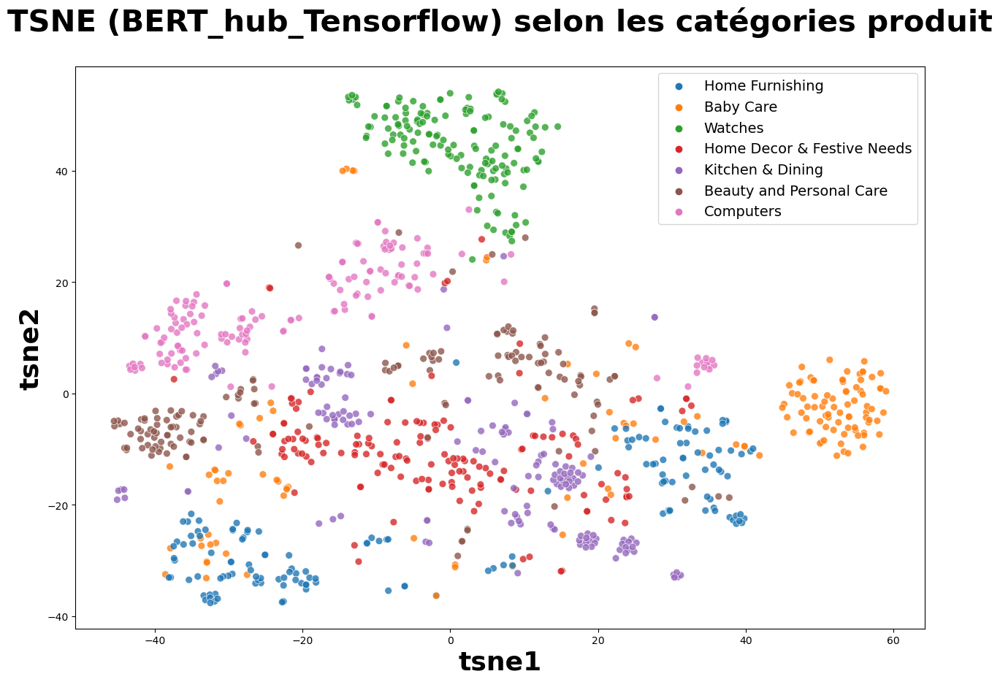

In [261]:
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_bert_hub_Tensorflow, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (BERT_hub_Tensorflow) selon les catégories produit', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

In [262]:
#Création de clusters à partir du T-SNE 
X = df_tsne_bert_hub_Tensorflow[["tsne1","tsne2"]]

cls_bert3 = KMeans(n_clusters=N_CLUSTERS, init='k-means++', random_state=0)
cls_bert3.fit(X)

df_tsne_bert_hub_Tensorflow["cluster"] = cls_bert3.labels_

sil = np.round(silhouette_score(X,cls_bert3.labels_,metric="euclidean"),2)
print("====================================================")
print("Le score de silhouette est", sil)
print("====================================================")

Le score de silhouette est 0.43


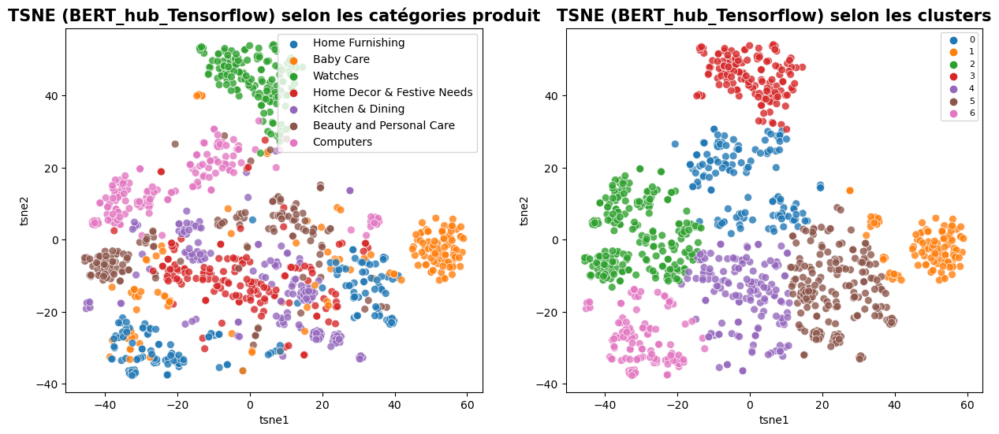

ARI :  0.323


C:\Users\yosra\AppData\Local\Temp\ipykernel_11672\3059067803.py:10: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [263]:
fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(121)
    
sns.scatterplot(
x="tsne1", y="tsne2", hue="class", data=df_tsne_bert_hub_Tensorflow, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (BERT_hub_Tensorflow) selon les catégories produit', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1' )
plt.ylabel('tsne2')
plt.legend(prop={'size': 10}) 


ax = fig.add_subplot(122)
sns.scatterplot(
x="tsne1", y="tsne2",
hue="cluster",
palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8, data=df_tsne_bert_hub_Tensorflow,legend="brief")

plt.title('TSNE (BERT_hub_Tensorflow) selon les clusters', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 

plt.show()

labels = products_text_data["label"]
ARI_bert3=np.round(metrics.adjusted_rand_score(labels, cls_bert3.labels_),3)

print("====================================================")
print(f"ARI : ",ARI_bert3)
print("====================================================")
df_resultats = add_model_score(
    model_name='BERT(hub Tensorflow) ', ARI=ARI_bert3)

In [264]:
df_tsne_bert_hub_Tensorflow.groupby("cluster").count()["class"]


cluster
0    134
1    108
2    217
3    146
4    148
5    190
6    107
Name: class, dtype: int64

## Répartition des vraies catégories par cluster(Qualité de la catégorisation)

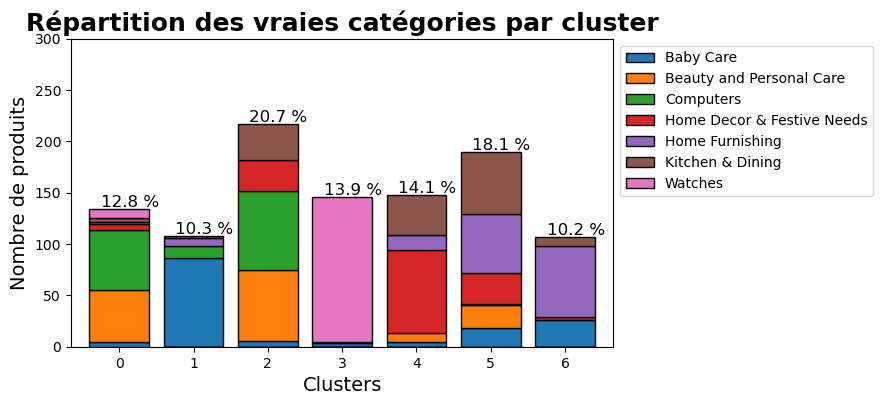

category,Baby Care,Beauty and Personal Care,Computers,Home Decor & Festive Needs,Home Furnishing,Kitchen & Dining,Watches
label,,,,,,,
0,5.0,50.0,59.0,6.0,1.0,4.0,9.0
1,86.0,0.0,12.0,0.0,8.0,2.0,0.0
2,6.0,69.0,77.0,30.0,0.0,35.0,0.0
3,4.0,0.0,1.0,0.0,0.0,0.0,141.0
4,5.0,8.0,0.0,81.0,15.0,39.0,0.0
5,18.0,23.0,1.0,30.0,57.0,61.0,0.0
6,26.0,0.0,0.0,3.0,69.0,9.0,0.0


In [265]:
plot_clust_vs_cat(df_tsne_bert_hub_Tensorflow["cluster"],
                              df_tsne_bert_hub_Tensorflow["class"],
                              df_tsne_bert_hub_Tensorflow,   
                              palette='tab10',
                              figsize=(7,4),
                              bboxtoanchor=(1,1), ylim=(0,300))

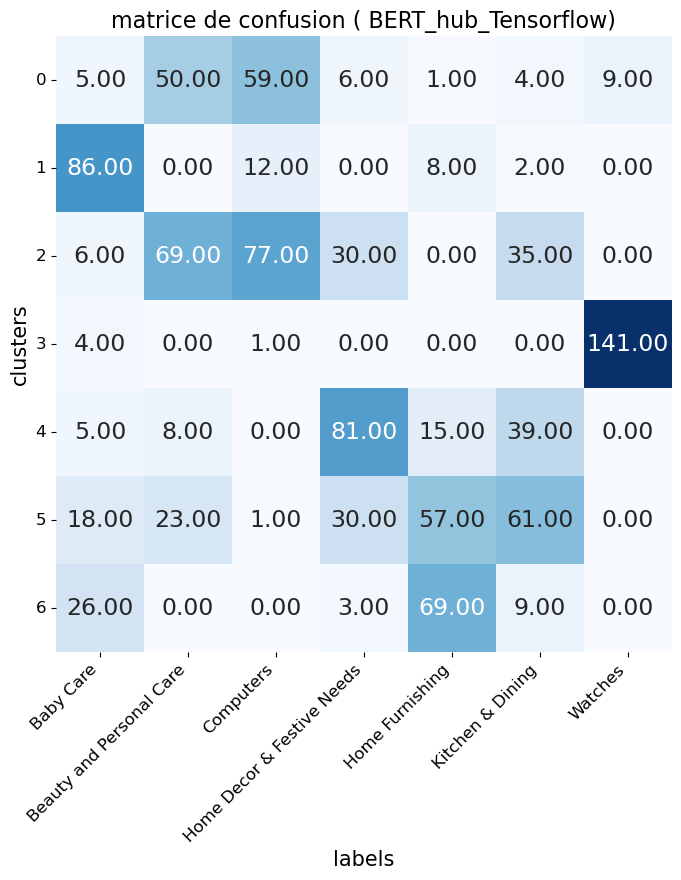

In [266]:
confusion_matrix( df_tsne_bert_hub_Tensorflow["class"],  df_tsne_bert_hub_Tensorflow["cluster"],
                 'matrice de confusion ( BERT_hub_Tensorflow)')

## USE - Universal Sentence Encoder

In [267]:
import tensorflow_hub as hub
USE_model_url = "https://tfhub.dev/google/universal-sentence-encoder/4"
# 1Gb model
embed = tensorflow_hub.load(USE_model_url)

In [268]:
def feature_USE_fct(sentences, b_size):
    batch_size = b_size
    time1 = time.time()

    for step in range(len(sentences)//batch_size):
        idx = step*batch_size
        feat = embed(sentences[idx:idx+batch_size])

        if step == 0:
            features = feat
        else:
            features = np.concatenate((features, feat))

    time2 = np.round(time.time() - time1, 0)
    print(f'feature_USE_fct, time_taken = {time2} s')
    return features

In [269]:
batch_size = 10
sentences = df_bert_use['sentence_dl'].to_list()

In [270]:
df_USE = feature_USE_fct(sentences, batch_size)

feature_USE_fct, time_taken = 2.0 s


## REDUCTION DE DIMENSION

In [271]:
print("Dimensions dataset avant réduction PCA : ", df_USE.shape)
pca = decomposition.PCA(n_components=0.99)
pca_results_USE= pca.fit_transform(df_USE)
print("Dimensions dataset après réduction PCA : ", pca_results_USE.shape)

Dimensions dataset avant réduction PCA :  (1050, 512)
Dimensions dataset après réduction PCA :  (1050, 344)


In [272]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_bert_hub_Tensorflow = tsne.fit_transform(pca_results_USE)

df_tsne_results_USE = pd.DataFrame(tsne_results_bert_hub_Tensorflow [:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_results_USE["class"] = products_text_data["category"]
print(df_tsne_results_USE.shape)

C:\Users\yosra\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



(1050, 3)


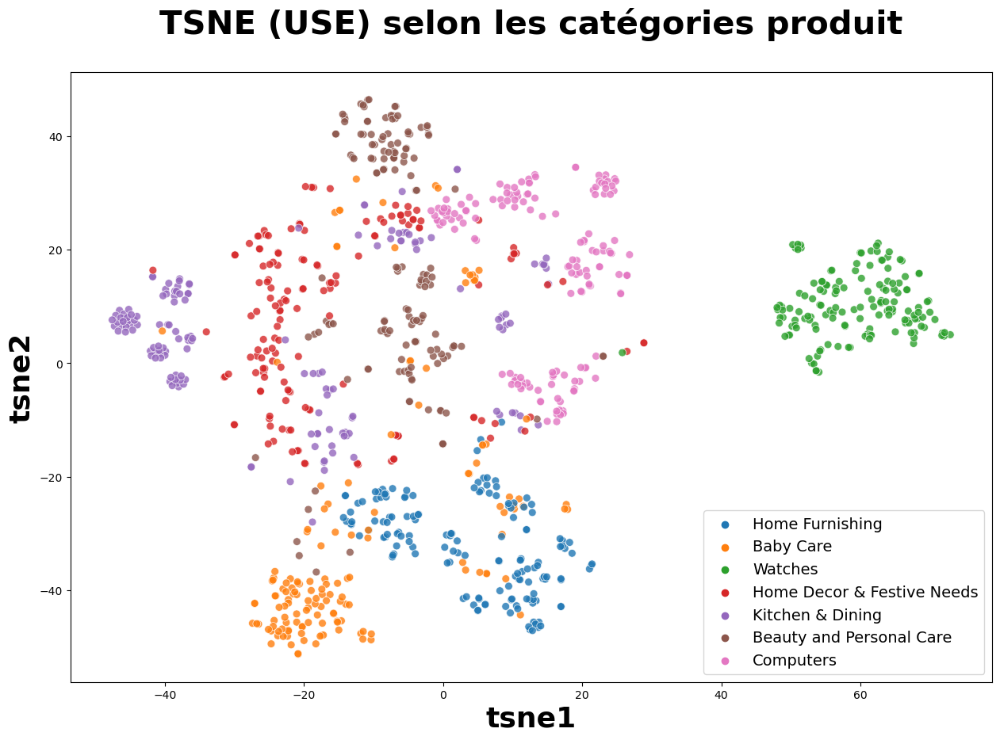

In [273]:
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_results_USE, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (USE) selon les catégories produit', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

In [274]:
#Création de clusters à partir du T-SNE 
X = df_tsne_results_USE[["tsne1","tsne2"]]

cls_use = KMeans(n_clusters=N_CLUSTERS, init='k-means++', random_state=0)
cls_use.fit(X)

df_tsne_results_USE["cluster"] = cls_use.labels_

sil = np.round(silhouette_score(X,cls_use.labels_,metric="euclidean"),2)
print("====================================================")
print("Le score de silhouette est", sil)
print("====================================================")

Le score de silhouette est 0.49


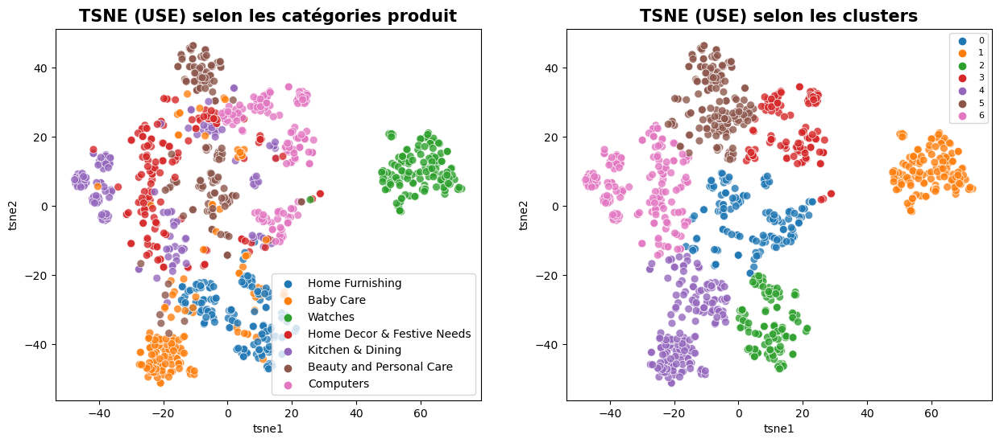

ARI :  0.422


C:\Users\yosra\AppData\Local\Temp\ipykernel_11672\3059067803.py:10: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [275]:
fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(121)
    
sns.scatterplot(
x="tsne1", y="tsne2", hue="class", data=df_tsne_results_USE, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (USE) selon les catégories produit', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1' )
plt.ylabel('tsne2')
plt.legend(prop={'size': 10}) 


ax = fig.add_subplot(122)
sns.scatterplot(
x="tsne1", y="tsne2",
hue="cluster",
palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8, data=df_tsne_results_USE,legend="brief")

plt.title('TSNE (USE) selon les clusters', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 

plt.show()

labels = products_text_data["label"]
ARI_use=np.round(metrics.adjusted_rand_score(labels, cls_use.labels_),3)

print("====================================================")
print(f"ARI : ",ARI_use)
print("====================================================")
df_resultats = add_model_score(
    model_name='USE ', ARI=ARI_use)


In [276]:
df_tsne_results_USE.groupby("cluster").count()["class"]


cluster
0    148
1    149
2    116
3    113
4    174
5    167
6    183
Name: class, dtype: int64

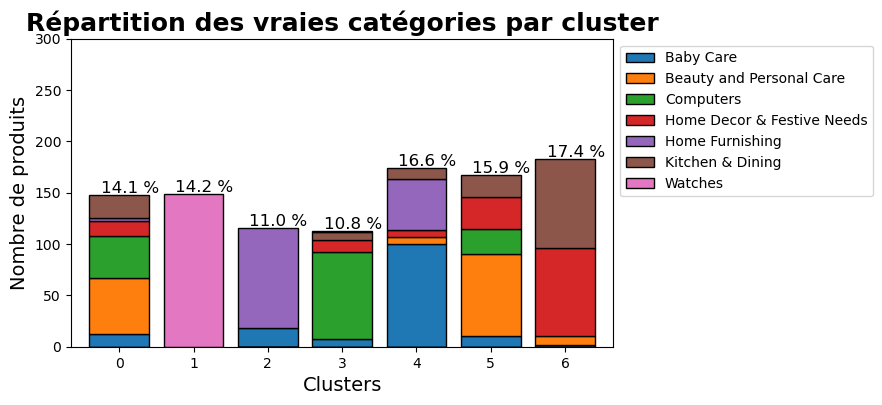

category,Baby Care,Beauty and Personal Care,Computers,Home Decor & Festive Needs,Home Furnishing,Kitchen & Dining,Watches
label,,,,,,,
0,12.0,55.0,41.0,14.0,3.0,23.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,149.0
2,18.0,0.0,0.0,0.0,98.0,0.0,0.0
3,8.0,0.0,84.0,12.0,0.0,8.0,1.0
4,100.0,7.0,0.0,7.0,49.0,11.0,0.0
5,10.0,80.0,25.0,31.0,0.0,21.0,0.0
6,2.0,8.0,0.0,86.0,0.0,87.0,0.0


In [277]:
plot_clust_vs_cat(df_tsne_results_USE["cluster"],
                              df_tsne_results_USE["class"],
                              df_tsne_results_USE,   
                              palette='tab10',
                              figsize=(7,4),
                              bboxtoanchor=(1,1), ylim=(0,300))

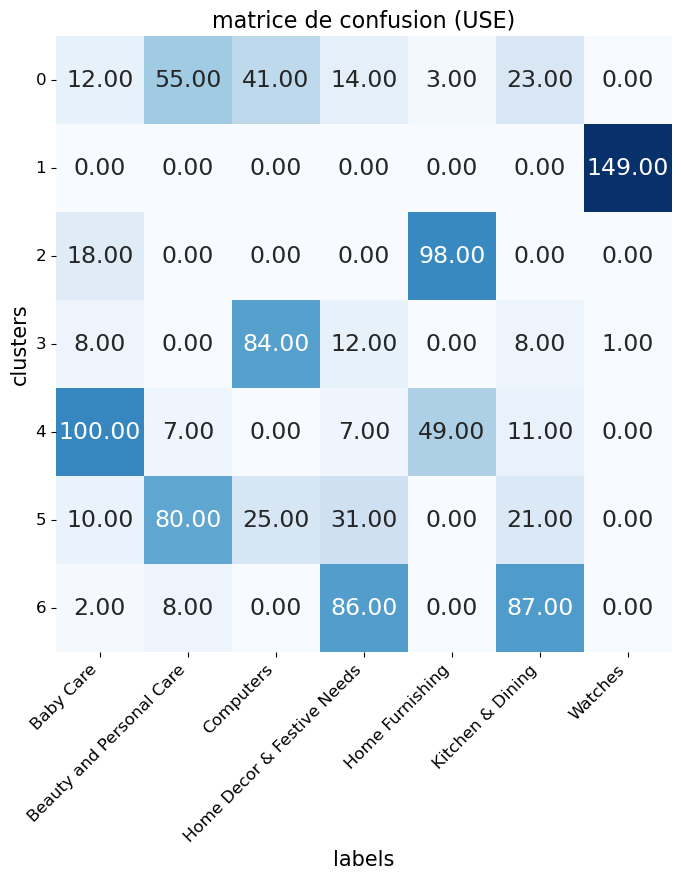

In [278]:
confusion_matrix( df_tsne_results_USE["class"],  df_tsne_results_USE["cluster"],
                 'matrice de confusion (USE)')

In [279]:
# Affichage des resultat 

df_resultats

,model,ARI
0,BOW,0.420
1,TF-IDF,0.532
2,Word2Vec,0.279
3,BERT (bert-base-uncased),0.357
4,BERT(hub Tensorflow),0.323
5,USE,0.422


# Partie 2: Classification des images

In [177]:
from PIL import Image
Image.MAX_IMAGE_PIXELS = 2000000000

In [178]:
#pip install opencv-python==4.5.5.64

In [596]:
import numpy as np
import cv2

In [597]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
import time
from sklearn import metrics
from sklearn import cluster
from sklearn import preprocessing
from sklearn.cluster import  KMeans
from sklearn.metrics import silhouette_score
from sklearn import manifold, decomposition
from yellowbrick.cluster import SilhouetteVisualizer
from matplotlib.image import imread
import cv2 as cv
import keras
from keras.preprocessing import image
from keras.models import Model
from PIL import Image, ImageOps ,ImageFilter
from tensorflow.python.keras.layers import Flatten
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [598]:
# Chargement du jeu de données
df = pd.read_csv('data_claned.csv')
df.head(2)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,category_0,category_1
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56+00:00,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Curtains & Accessories
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56+00:00,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care,Baby Bath & Skin


In [599]:
path = "./Images/"
df['image_loc'] = [path + row for row in df['image']]

In [600]:
df_img = df.copy()
df_img= df_img[['image', 'image_loc','category_0']]
df_img.head(3)

,image,image_loc,category_0
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,./Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,./Images/7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,./Images/64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care


In [601]:
df_image_par_cat = df_img.groupby('category_0').agg({'image' : 'count'})
df_image_par_cat

,image
category_0,
Baby Care,150
Beauty and Personal Care,150
Computers,150
Home Decor & Festive Needs,150
Home Furnishing,150
Kitchen & Dining,150
Watches,150


Home Furnishing


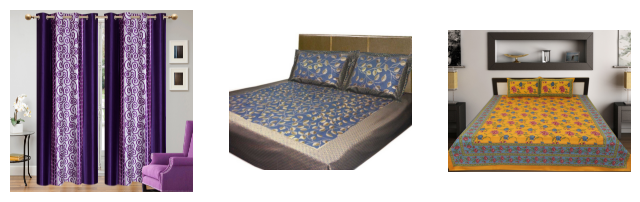

Baby Care


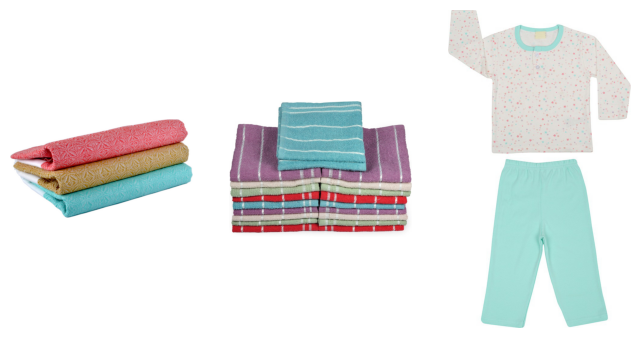

Watches


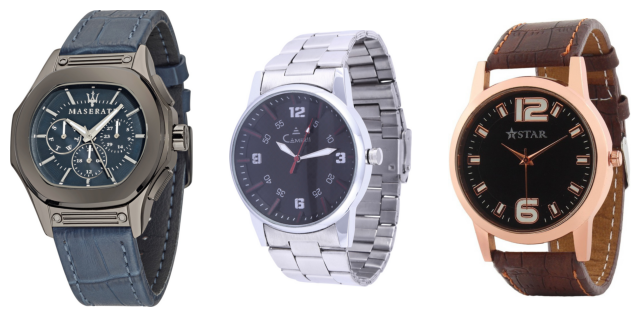

Home Decor & Festive Needs


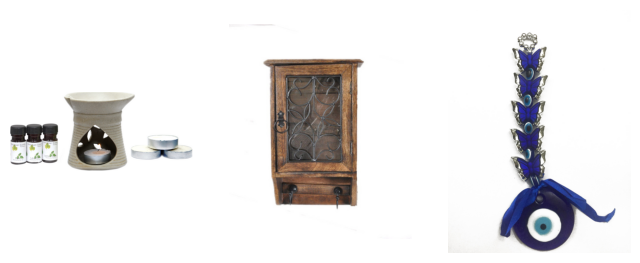

Kitchen & Dining


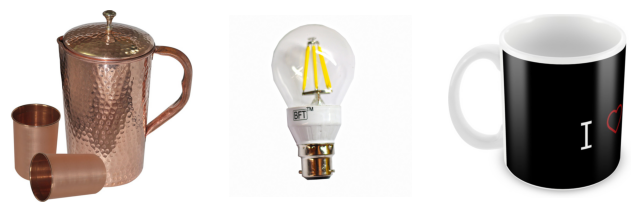

Beauty and Personal Care


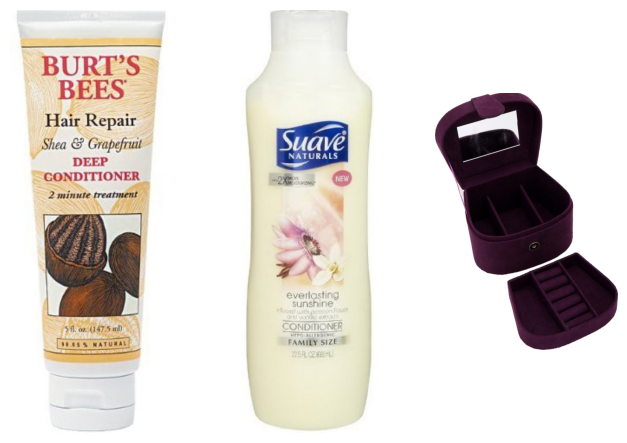

Computers


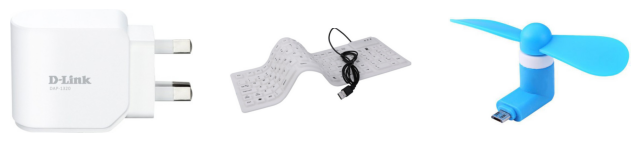

In [602]:
# affichage des images 

for j, categ in enumerate(df_img["category_0"].unique()) :
    bolded_string = "\033[1m" + categ + "\033[0m"
    print(bolded_string)
    # print("-------")
    for i in range(3):
        name_image = df_img[df_img["category_0"] == categ]["image"].iloc[i]
        plt.subplot(130 + 1 + i)
        filename = path + name_image
        img = imread(filename)
        plt.imshow(img)
        plt.axis('off')    
    plt.show()  

In [603]:
# Déscription des images 

# Largeur des images
df_img['Largeur_img'] = [Image.open(row).size[0] for row in df_img['image_loc']]
# Hauteur des images
df_img['Hauteur_img'] = [Image.open(row).size[1] for row in df_img['image_loc']]
# Taille des images
df_img['Taille_img'] = [(Image.open(row).size[0] * Image.open(row).size[1])
                      for row in df_img['image_loc']]
# Format des images
df_img['Format_img'] = [Image.open(row).mode for row in df_img['image_loc']]
df_img.head(3)

,image,image_loc,category_0,Largeur_img,Hauteur_img,Taille_img,Format_img
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,./Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,3600,3600,12960000,RGB
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,./Images/7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,2388,1293,3087684,RGB
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,./Images/64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,982,729,715878,RGB


## 1 Pré-traitement de toutes les images

* PIL (Pyhton Imaging Library) et OpenCV (Open Compute Vision) sont des librairies qui comprennent un ensemble de méthodes permettant de charger, traiter les images (redimensionnement, filtres...). Ces librairies seront utilisées pour le pré-traitement des images.


* Le traitement sera effectué en 4 étapes :

    -  redimensionnement en 224 * 224,
    -  conversion de RGB (couleurs vraies) en niveaux de gris (pour Sift),
    -  suppression du bruit,
    -  égalisation de l'histogramme.

In [604]:
def image_histopixel(image, titre):
    '''
    Afficher côte à côte l'image et l'histogramme de répartiton des pixels.
    Parameters
    ----------
    image : image à afficher, obligatoire.
    Returns
    -------
    None.
    '''
    plt.figure(figsize=(40, 10))
    plt.subplot(131)
    plt.title(titre, fontsize=30)
    plt.imshow(image, cmap='gray')
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.subplot(132)
    plt.title('Histogramme de répartition des pixels', fontsize=30)
    hist, bins = np.histogram(np.array(image).flatten(), bins=256)
    plt.bar(range(len(hist[0:255])), hist[0:255])
    plt.xlabel('Niveau de gris', fontsize=30)
    plt.ylabel('Nombre de pixels', fontsize=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.subplot(133)
    plt.title('Histogramme cumulé des pixels', fontsize=30)
    plt.hist(np.array(image).flatten(), bins=range(256), cumulative=True)
    plt.xlabel('Niveau de gris', fontsize=24)
    plt.ylabel('Fréquence cumulée de pixels', fontsize=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.show()

In [605]:
dim = (224, 224)

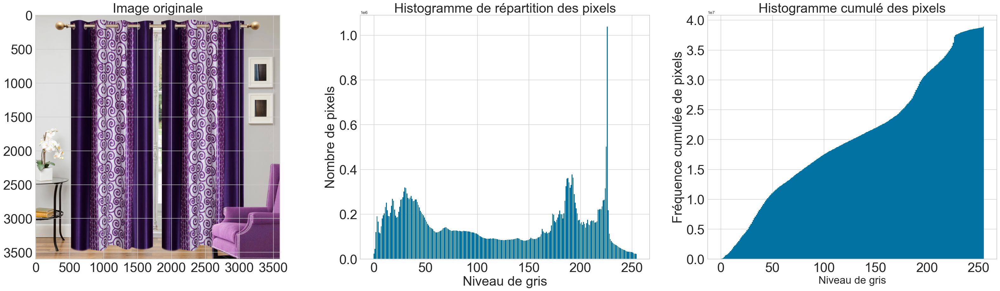

In [606]:
img_orig = Image.open('./Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg')
image_histopixel(img_orig, 'Image originale')

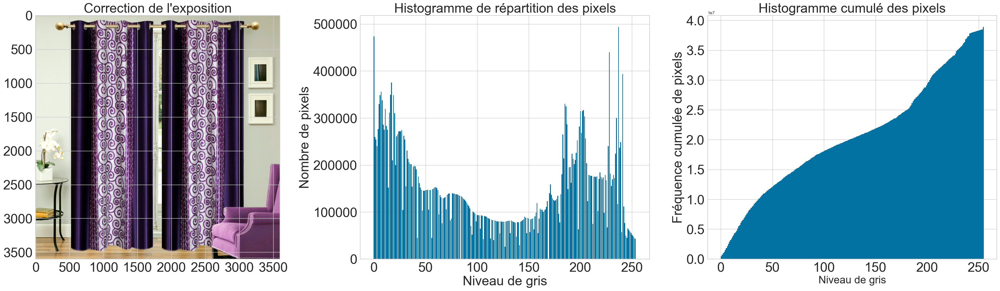

In [607]:
# Correction de l'exposition PILS
img_expo = ImageOps.autocontrast(img_orig, 1)
image_histopixel(img_expo, 'Correction de l\'exposition')

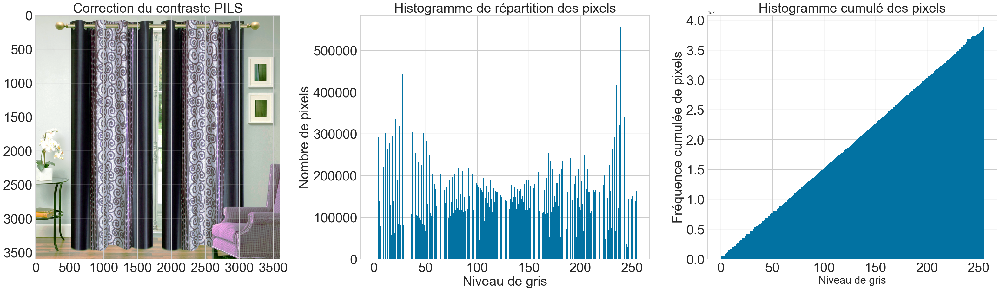

In [608]:
# Correction du contraste PILS
img_contr_pils = ImageOps.equalize(img_expo)
image_histopixel(img_contr_pils,'Correction du contraste PILS')

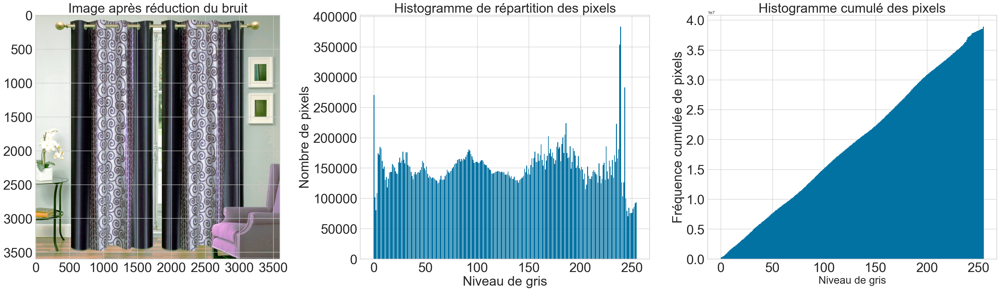

In [609]:
# Réduction du bruit (filtre)
img_filter = img_contr_pils.filter(ImageFilter.BoxBlur(1))
image_histopixel(img_filter,'Image après réduction du bruit')

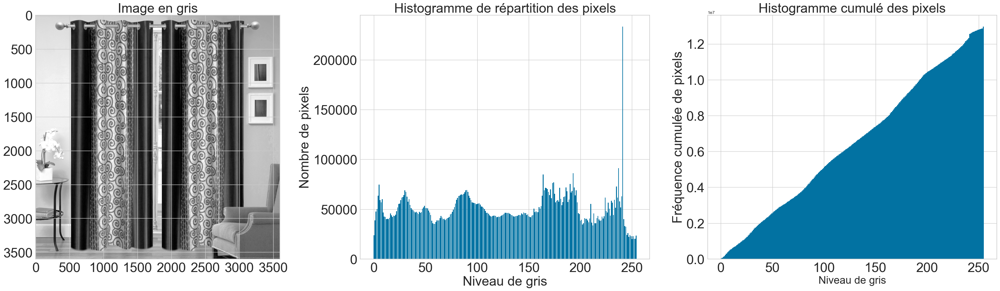

In [610]:
# Conversion de l'image en niveau de gris pour SIFT
img_gris = cv.cvtColor(np.array(img_filter), cv.COLOR_RGB2GRAY)
image_histopixel(img_gris,'Image en gris')

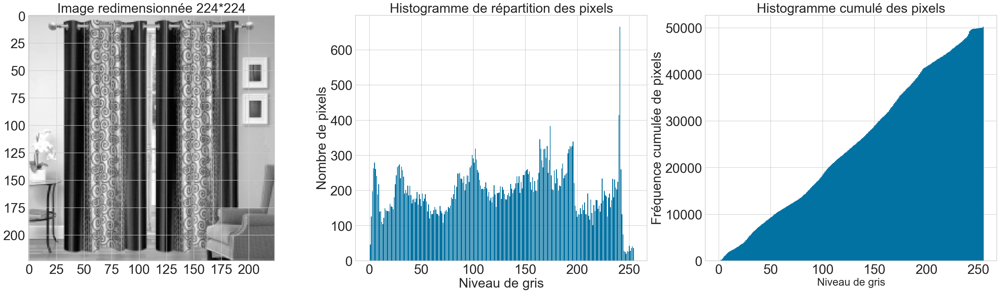

In [611]:
# Redimensionnement image contraste PILS
img_redim_pils = cv.resize(np.array(img_gris), dim,
                            interpolation=cv.INTER_AREA)
image_histopixel(img_redim_pils,'Image redimensionnée 224*224')

In [612]:
from matplotlib.image import imread

In [613]:
def preprocess_image(image):
    '''
    le pré-traitement suivant est appliqué sur toutes les images :
    - Correction de l'exposition (étirement d'histogramme) 
    - Correction du contraste (égalisation d'histogramme)    
    - Réduction du bruit 
    - Conversion en niveau de gris de l'image (ORB, SIFT...).
    - Réduction de dimension
    Parameters
    ----------
    image : image localisée dans un répertoire, obligatoire.
    Returns
    -------
    None
    '''
    # Variables locales
    dim = (224, 224)
    dir_images_transformed = '../Flipkart/pic/'
    
    # Nom de l'image
    file_dir = os.path.split(image)

    # Chargement de l'image originale
    img = Image.open(image)

    # Correction de l'exposition PILS (étirement de l'histogramme)
    img = ImageOps.autocontrast(img, 1)

    # Correction du contraste (égalisation de l'histogramme)
    img = ImageOps.equalize(img)
    
    # Réduction du bruit 
    img = img.filter(ImageFilter.BoxBlur(1))
    
    # Conversion en niveau de gris de l'image
    img = cv2.cvtColor(np.array(img), cv.COLOR_BGR2GRAY)    
    
    # Redimensionnement en 224 * 224
    img = cv2.resize(np.array(img), dim, interpolation=cv.INTER_AREA)

    # Sauvegarde de l'image dans le répertoire data/Images_process
    cv2.imwrite('../Flipkart/pic/' + file_dir[1], img)

    # Transforme un array en Image
    img = Image.fromarray(img) 
    
    # Sauvegarde de l'image dans le répertoire ../Flipkart/Images_process/
    img.save(os.path.join(dir_images_transformed, file_dir[1]))    
    
    return '../Flipkart/pic/' + file_dir[1]

In [614]:
# Pré-traitement de toutes les images
df_img['images_proces'] = df_img['image_loc'].apply(preprocess_images)
df_img.head(3)

,image,image_loc,category_0,Largeur_img,Hauteur_img,Taille_img,Format_img,images_proces
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,./Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,3600,3600,12960000,RGB,.pic/Images_process/55b85ea15a1536d46b7190ad6f...
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,./Images/7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,2388,1293,3087684,RGB,.pic/Images_process/7b72c92c2f6c40268628ec5f14...
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,./Images/64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,982,729,715878,RGB,.pic/Images_process/64d5d4a258243731dc7bbb1eef...


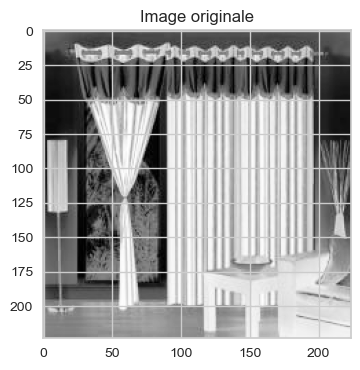

In [615]:
# Chargement de l'image précédemment traitée
img =imread('./pic/678ebb5f6057dcc51948253c1b39b0b8.jpg')
# Visualisation de l'image
plt.figure(figsize=(4, 4))
plt.title('Image originale')
plt.imshow(img)
plt.show()

#### Méthode SIFT


La scale-invariant feature transform (SIFT), que l'on peut traduire par « transformation de caractéristiques visuelles invariante à l'échelle », est un algorithme utilisé pour détecter et identifier les éléments similaires entre différentes images numériques (éléments de paysages, objets, personnes, etc.). Il a été développé en 1999.


L'étape fondamentale de la méthode consiste à calculer ce que l'on appelle les « descripteurs SIFT » des images à étudier. Il s'agit d'informations numériques dérivées de l'analyse locale d'une image et qui caractérisent le contenu visuel de cette image de la façon la plus indépendante possible de l'échelle (« zoom » et résolution du capteur), du cadrage, de l'angle d'observation et de l'exposition (luminosité).


Ainsi, deux photographies d'un même objet auront toutes les chances d'avoir des descripteurs SIFT similaires, et ceci d'autant plus si les instants de prise de vue et les angles de vue sont proches.


Voici le protocole que l'on va mettre en place, pour créer notre moteur de classification des produits à partir des images avec SIFT :

         1- Pour chaque image du jeu de données
- lire l'image
- Réaliser le pre-processing de l'image pour augmenter la capacité de SIFT à détecter correctement les descripteurs
- Passer l'image en niveau de gris
- Extraction des descripteurs

        2- Création d'une matrice contenant l'ensemble des descripteurs
        3- Clustérisation pour création des Bag of Virtual Words
        4- Création des Histogrammes
        5- Réduction de dimension PCA + T-SNE
        6- Calcul du score ARI

##  Extraction des features
Nous allons utiliser l'algorithme SIFT (Scale Invariant Feature Transform)

La méthodoligie d'extraction de features par SIFT se fait en 3 étapes :

    - Récupérer les descripteurs de chaque image par un algorithme de type SIFT
    - Clusteriser l'ensemble de tous les descripteurs
    - Construction de l'histogramme pour chaque image (Bag of Visual Words)

### Extraction des descripteurs sur une image


In [616]:
def gen_sift_features(gray_img):
    sift = cv.SIFT_create()
    # kp is the keypoints
    # desc is the SIFT descriptors, they're 128-dimensional vectors
    # that we can use for our final features
    kp, desc = sift.detectAndCompute(gray_img, None)
    return kp, desc

In [617]:
# Transformation del'image en matrice de pixels pour OpenCV
mug = np.array(img)

# Extraction des keypoints et descripteurs SIFT
sift_keypoints, sift_descripteurs = gen_sift_features(img)

print(f"L'image contient {sift_descripteurs.shape[0]} descripteurs SIFT")
print(f'Chaque descripteur est un vecteur de longueur {sift_descripteurs.shape[1]}')

L'image contient 354 descripteurs SIFT
Chaque descripteur est un vecteur de longueur 128


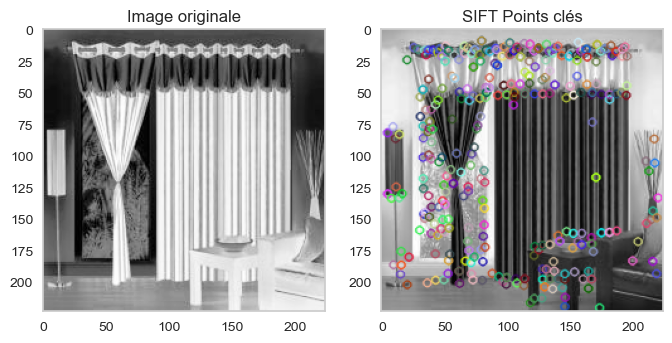

In [618]:
# Visualisation des points d'intérêt
sift_img_keypoints = cv.drawKeypoints(img, sift_keypoints, None)

plt.figure(figsize=(8, 4))
plt.grid(False)

# Image originale
plt.subplot(1, 2, 1)
plt.grid(False)
plt.title('Image originale')
plt.imshow(img)

# Image avec les points clés
plt.subplot(1, 2, 2)
plt.grid(False)
plt.imshow(sift_img_keypoints)
plt.title('SIFT Points clés')

plt.show()

### Extraction des descripteurs SIFT sur l'ensemble des images

On va  détecter les features, extrayers les descripteurs de chaque image du dataset et construire un dictionnaire visuel.

In [619]:
descriptors_unclustered = []

In [620]:
sift = cv2.SIFT_create(500)

for i in range(len(df.image)):
    image = cv2.imread(path + df.image[i],0)
    im_equalize = cv2.equalizeHist(image)
    im_resize = cv2.resize(im_equalize, (255, 255))
    kp, dsc = sift.detectAndCompute(im_resize, None)
    descriptors_unclustered.append(dsc)

In [621]:
sift_keypoints_by_img = np.asarray(descriptors_unclustered)
sift_keypoints_all = np.concatenate(sift_keypoints_by_img, axis=0)

C:\Users\yosra\AppData\Local\Temp\ipykernel_4484\3531999367.py:1: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



### Clustering des descripteurs

On a maintenant une matrice avec un grand nombre de descripteurs. Nous ne pouvons pas tous les utiliser la modélisation, nous devons donc les regrouper. Une règle empirique consiste à créer k centres avec k = nombre de catégories * 10 (dans notre cas, c'est 70)

In [622]:
from sklearn.cluster import MiniBatchKMeans

In [623]:
im_kmeans = MiniBatchKMeans(n_clusters=70, init_size=3*70, verbose=1).fit(sift_keypoints_all)

Init 1/3 with method k-means++
Inertia for init 1/3: 26830400.0
Init 2/3 with method k-means++
Inertia for init 2/3: 26461036.0
Init 3/3 with method k-means++
Inertia for init 3/3: 27613410.0
Minibatch step 1/34946: mean batch inertia: 125159.3984375
[MiniBatchKMeans] Reassigning 2 cluster centers.
Minibatch step 2/34946: mean batch inertia: 89859.953125, ewa inertia: 89859.953125
Minibatch step 3/34946: mean batch inertia: 86342.2890625, ewa inertia: 89839.82168702337
[MiniBatchKMeans] Reassigning 1 cluster centers.
Minibatch step 4/34946: mean batch inertia: 84645.046875, ewa inertia: 89810.09221738878
Minibatch step 5/34946: mean batch inertia: 84959.0546875, ewa inertia: 89782.3299412248
[MiniBatchKMeans] Reassigning 2 cluster centers.
Minibatch step 6/34946: mean batch inertia: 85154.6328125, ewa inertia: 89755.84583243378
Minibatch step 7/34946: mean batch inertia: 82983.875, ewa inertia: 89717.09013877732
Minibatch step 8/34946: mean batch inertia: 81474.7421875, ewa inertia: 89

#### Construction de l'histogramme pour chaque image (Bag of Visual Words)

pour chaque image, on fait un histogramme de fréquence à partir des vocabulaires (les centres des clusters obtenus à l'étape précédente) et de la fréquence des vocabulaires dans l'image. Ces histogrammes sont nos sacs de mots visuels (BOVW).

In [624]:
def build_histogram(im_kmeans, des, image_num):
    res = im_kmeans.predict(des)
    hist = np.zeros(len(im_kmeans.cluster_centers_))
    nb_des=len(des)
    if nb_des==0 : 
        print("problème histogramme image  : ", image_num)
    for i in res:
        hist[i] += 1.0/nb_des
    return hist

In [625]:
hist_vectors=[]

for i, image_desc in enumerate(sift_keypoints_by_img) :
    hist = build_histogram(im_kmeans, image_desc, i) # calculates the histogram
    hist_vectors.append(hist) #histogram is the feature vector

im_features = np.asarray(hist_vectors)

In [626]:
list_photos=df_img['images_proces']

In [627]:
k = int(round(np.sqrt(len(sift_keypoints_all)),0))
print("Nombre de clusters estimés : ", k)
print("Création de",k, "clusters de descripteurs ...")

# Clustering
kmeans = cluster.MiniBatchKMeans(n_clusters=k, init_size=3*k, random_state=0)
kmeans.fit(sift_keypoints_all)

Nombre de clusters estimés :  598
Création de 598 clusters de descripteurs ...


MiniBatchKMeans(init_size=1794, n_clusters=598, random_state=0)

### Réduction de dimension

* ACP

In [628]:
print("Dimensions dataset avant réduction PCA : ", im_features.shape)
pca = decomposition.PCA(n_components=0.99)
pca_results_img= pca.fit_transform(im_features)
print("Dimensions dataset après réduction PCA : ", pca_results_img.shape)

Dimensions dataset avant réduction PCA :  (1050, 70)
Dimensions dataset après réduction PCA :  (1050, 62)


* Tsne

In [629]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_img = tsne.fit_transform(pca_results_img)

df_tsne_img = pd.DataFrame(tsne_results_img[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_img["class"] = df_img["category_0"]
print(df_tsne_img.shape)

(1050, 3)


### Visualisation

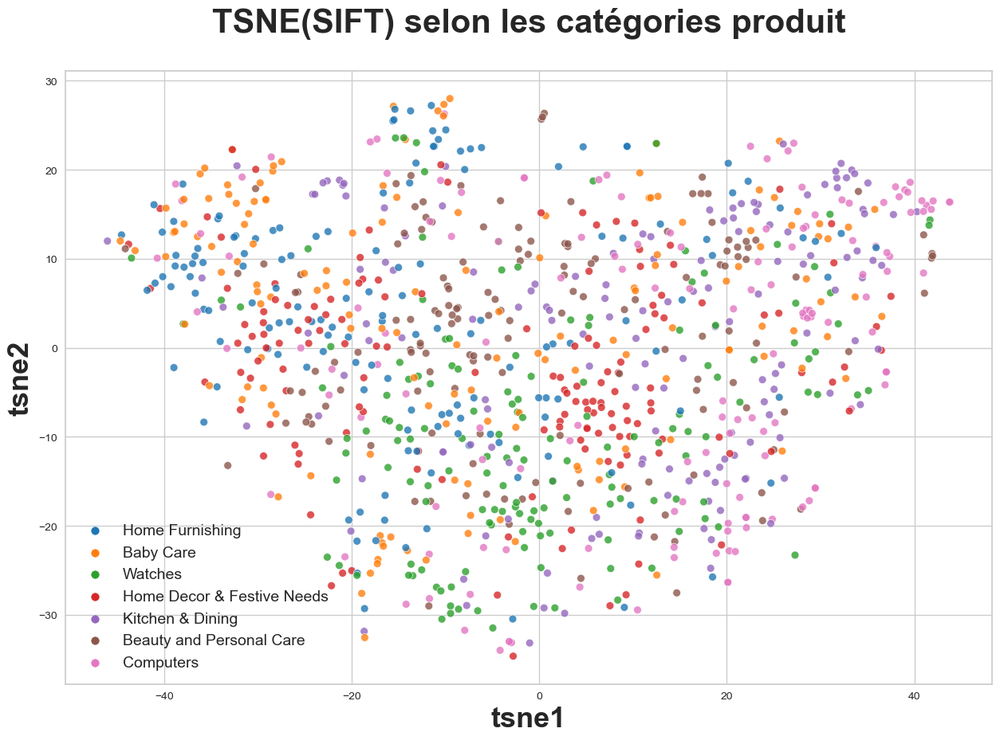

In [630]:
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_img, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE(SIFT) selon les catégories produit', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

In [631]:
#Création de clusters à partir du T-SNE 
X = df_tsne_img[["tsne1","tsne2"]]

cls = KMeans(n_clusters=7, init='k-means++', random_state=0)
cls.fit(X)

df_tsne_img["cluster"] = cls.labels_

sil = silhouette_score(X,cls.labels_,metric="euclidean")
print("Le score de silhouette est", sil)

Le score de silhouette est 0.38353902


In [632]:
# Création des labels à partir du nom de catégory produit
df_img["label"] = le.fit_transform(df_img["category_0"])

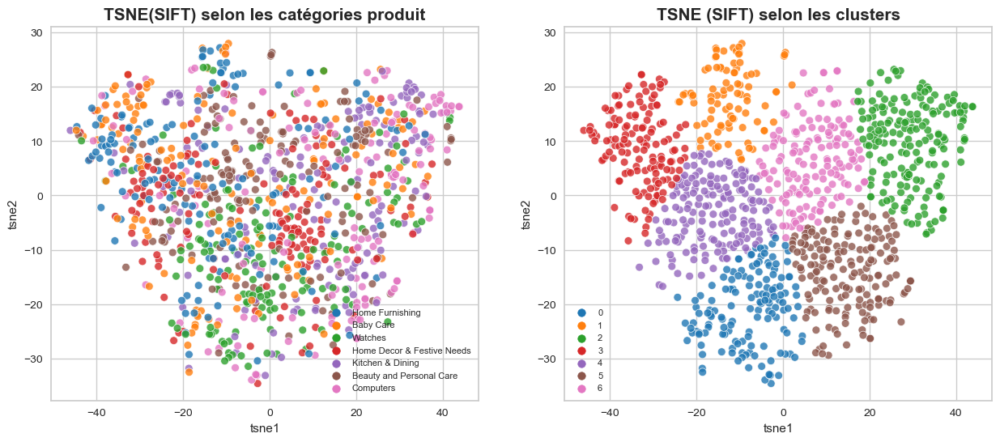

ARI :  0.04421930083650616


In [633]:
fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(121)
    

sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_img, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE(SIFT) selon les catégories produit', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 



ax = fig.add_subplot(122)
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
    data=df_tsne_img,
    legend="brief")

plt.title('TSNE (SIFT) selon les clusters', fontsize =15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 

plt.show()


print("=================================")
labels = df_img["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))
print("==================================")


#### Qualité de la catégorisation
#### répartition des vraies catégories par cluster

In [634]:
# Fonction pour afficher la répartition des vraies catégories par cluster

def plot_clust_vs_cat(ser_clust, ser_cat, data, figsize=(8,4),
                                  palette='tab10', ylim=(0,250),
                                  bboxtoanchor=None):
    
    # pivot = data.drop(columns=['description','image'])
    pivot = pd.DataFrame()
    pivot['label']=ser_clust
    pivot['category']=ser_cat
    pivot['count']=1
    pivot = pivot.groupby(by=['label','category']).count().unstack().fillna(0)
    pivot.columns=pivot.columns.droplevel()
    
    colors = sns.color_palette(palette, ser_clust.shape[0]).as_hex()
    pivot.plot.bar(width=0.8,stacked=True,legend=True,figsize=figsize,
                   color=colors, ec='k')

    row_data=data.shape[0]

    if ser_clust.nunique() > 15:
        font = 8 
    else : 
        font = 12

    for index, value in enumerate(ser_clust.value_counts().sort_index(ascending=True)):
        percentage = np.around(value/row_data*100,1)   
        plt.text(index-0.25, value+2, str(percentage)+' %',fontsize=font)

    plt.gca().set(ylim=ylim)
    plt.xticks(rotation=0) 

    plt.xlabel('Clusters',fontsize=14)
    plt.ylabel('Nombre de produits', fontsize=14)
    plt.title('Répartition des vraies catégories par cluster',
              fontweight='bold', fontsize=18)

    if bboxtoanchor is not None:
        plt.legend(bbox_to_anchor=bboxtoanchor)
        
    plt.show()    
    
    return pivot

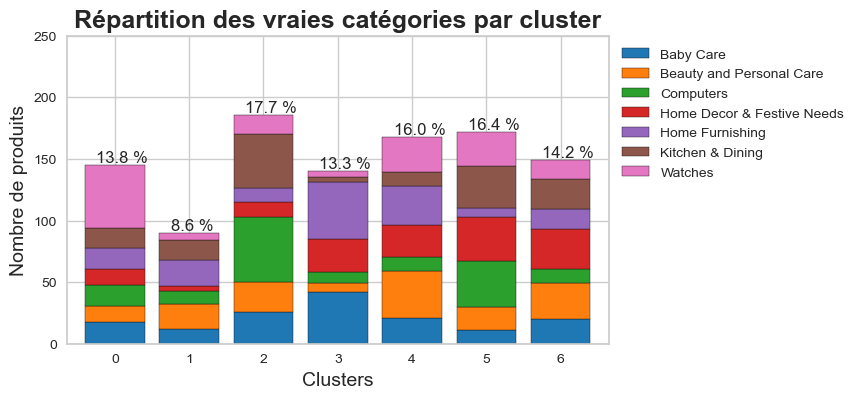

category,Baby Care,Beauty and Personal Care,Computers,Home Decor & Festive Needs,Home Furnishing,Kitchen & Dining,Watches
label,,,,,,,
0,18,13,17,13,17,16,51
1,12,20,11,4,21,16,6
2,26,24,53,12,11,44,16
3,42,7,9,27,46,4,5
4,21,38,11,26,32,11,29
5,11,19,37,36,7,34,28
6,20,29,12,32,16,25,15


In [635]:
plot_clust_vs_cat( df_tsne_img["cluster"],
                               df_tsne_img["class"],
                               df_tsne_img,   
                              palette='tab10',
                              figsize=(7,4),
                              bboxtoanchor=(1,1), ylim=(0,250))

In [636]:
# Affiche la matrice de confusion

def confusion_matrix(y_true, y_pred, title):
    """ xxx
    Args:
        y_true list(str):
        y_pred list(int):
        title (str): 
    Returns:
        -
    """
    # Create a DataFrame with labels and varieties as columns: df
    df = pd.DataFrame({'Labels': y_true, 'Clusters': y_pred})

    # Create crosstab: ct
    ct = pd.crosstab(df['Labels'], df['Clusters'])

    # plot the heatmap for correlation matrix
    fig, ax = plt.subplots(figsize=(10, 8))

    sns.heatmap(ct.T, 
                 square=True, 
                 annot=True, 
                 annot_kws={"size": 17},
                 fmt='.2f',
                 cmap='Blues',
                 cbar=False,
                 ax=ax)

    ax.set_title(title, fontsize=16)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=12)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, ha="right", fontsize=12)
    ax.set_ylabel("clusters", fontsize=15)
    ax.set_xlabel("labels", fontsize=15)

    plt.show()

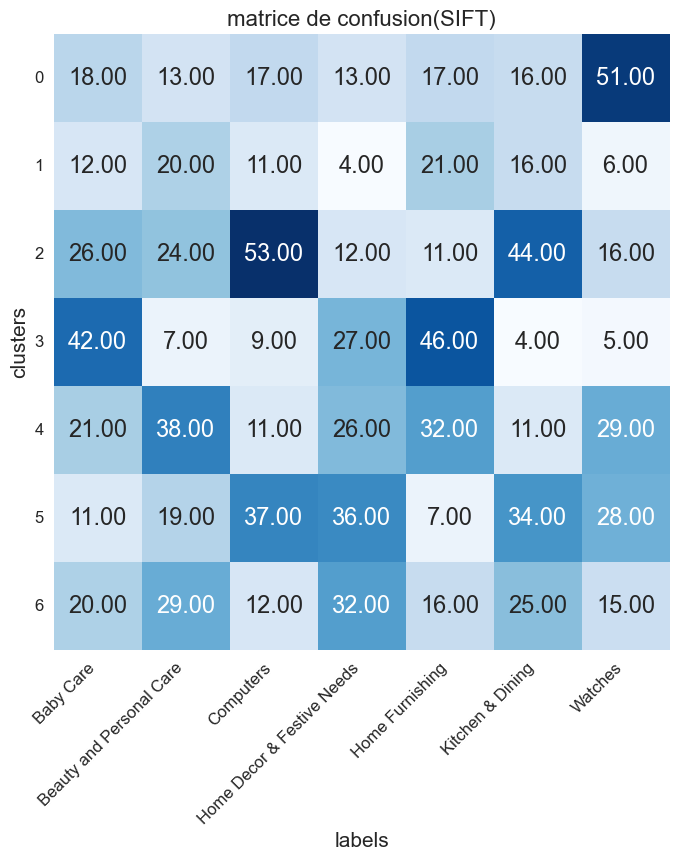

In [637]:
confusion_matrix(df_tsne_img["class"], df_tsne_img["cluster"], 'matrice de confusion(SIFT)')

### Méthode Transfert Learning avec VGG16

Nous allons dans cette partie utiliser Keras, une bibliothèque de Deep Learning.

Nous utiliserons une version du réseau de neurones convolutif VGG-Net nommé VGG16.

=> Keras nous fourni une version pré-entraînée de VGG16

- VGG-16 est une version du réseau de neurones convolutif VGG-Net.

- VGG-16 est constitué de plusieurs couches, dont 13 couches de convolution et 3 fully-connected. Il doit donc apprendre les poids de 16 couches.

- Il prend en entrée une image en couleurs de taille 224 × 224 px et la classifie dans une des 1000 classes. Il renvoie donc un vecteur de taille 1000, qui contient les probabilités d'appartenance à chacune des classes.

- le Transfer Learning consiste à utiliser le modèle VGG16 pré-entraîné sur ImageNet (ImageNet est un projet de recherche visant à développer une grande base de données d'images avec des annotations, c'est-à-dire des images et leurs descriptions).

3 étapes à suivre

- ÉTAPE 1 - Chargement des images, extraction des features (Prétraiter chaque image selon l'entrée acceptée par le modèle d'apprentissage par transfert et convertir chaque image en vecteur respectif en utilisant les poids du modèle d'apprentissage par transfert. Ensuite, aplatissez et stockez tous les poids des images dans une liste.)

- ÉTAPE 2 - Réduction de dimension

- ÉTAPE 3 - Clustering

### Création du modèle d'étude avec VGG16

#### Chargement des images, extraction des features

In [532]:
# Utilisation de VGG16 pré-entraîné sur ImageNet avec les images d'origine

# Liste
vgg16_all_features = []

# Instanciation du modèle
model_vgg16 = VGG16()

# Remove the output layer
model_vgg16= Model(inputs=model_vgg16.inputs, outputs=model_vgg16.layers[-2].output)

# Résumé de l'architecture du modèle
model_vgg16.summary()

for rep_image in df_img['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    
    img = load_img(rep_image, target_size=(224, 224))
    
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    
    img = img_to_array(img)
    
    # Redimensionnement
    
    img = np.expand_dims(img, axis=0)
    
    # Préparer de nouvelles entrées pour le réseau.
    
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun des 1000 types d'objets connus.
    
    vgg16_feature = model_vgg16.predict(img)
    
    # Ajouter la feature prédite en nparray à la liste
    
    vgg16_all_features.append(np.array(vgg16_feature).flatten())

vgg16_all_features = np.array(vgg16_all_features)

553467096/553467096 [==============================] - 345s 1us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                          

In [533]:
# Dataframe de sauvegarde des BOVW VGG16
# Association des features à chaque image
df_img['vgg16_bovw'] = [vgg16_all_features[i] for i in range(df_img.shape[0])]
# Dataframe de travail
df_vgg16_bovw = df_img[['image', 'image_loc', 'category_0', 'vgg16_bovw']]
# Constituer le dataframe de vecteurs de BOVW VGG16
df_vgg16_vectors = pd.DataFrame.from_records(vgg16_all_features)

### Réduction de dimension

* PCA

La réduction PCA tout en gardant 99% de variance expliquée

In [535]:
print("Dimensions dataset avant réduction PCA : ", df_vgg16_vectors.shape)
pca = decomposition.PCA(n_components=0.99)
pca_results_vgg16 = pca.fit_transform(df_vgg16_vectors)
print("Dimensions dataset après réduction PCA : ", pca_results_vgg16.shape)

Dimensions dataset avant réduction PCA :  (1050, 4096)
Dimensions dataset après réduction PCA :  (1050, 803)


* TSNE

Réduction de dimension en 2 composantes T-SNE pour affichage en 2D des images

In [537]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
tsne_results_vgg16 = tsne.fit_transform(pca_results_vgg16)

df_tsne_vgg16 = pd.DataFrame(tsne_results_vgg16[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne_vgg16["class"] =df_img["category_0"]
print(df_tsne_vgg16.shape)

(1050, 3)


### Visualisation

Affichage T-SNE selon les catégories d'images

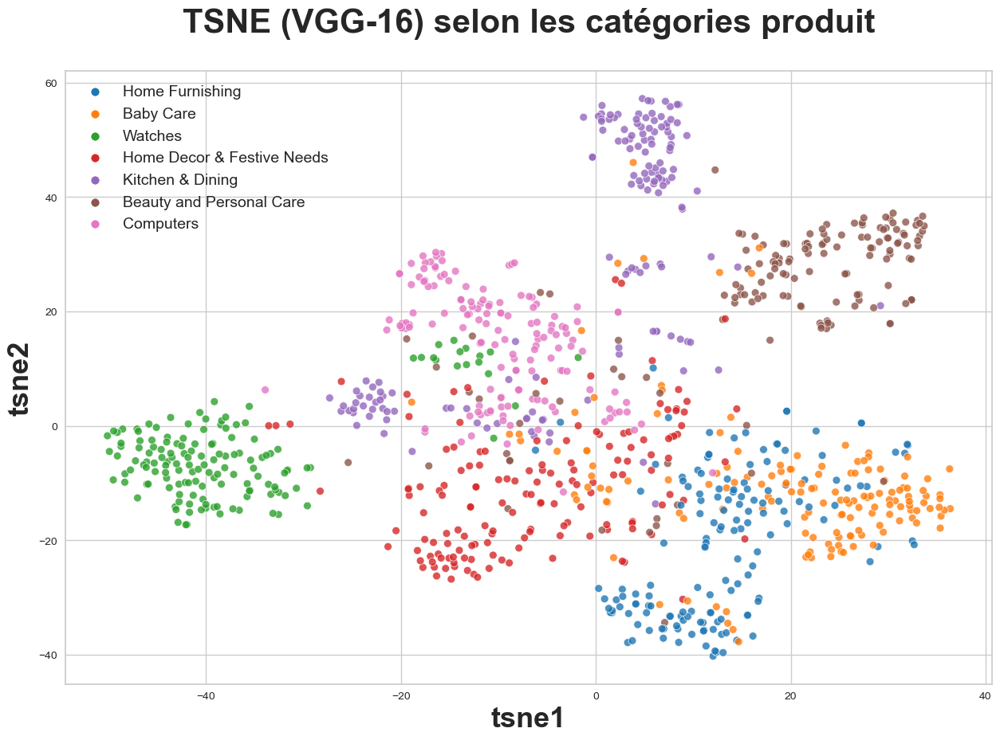

In [538]:
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_vgg16, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (VGG-16) selon les catégories produit', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

### Clustering

In [539]:
#Création de clusters à partir du T-SNE 
X = df_tsne_vgg16[["tsne1","tsne2"]]

cls = KMeans(n_clusters=7, init='k-means++', random_state=0)
cls.fit(X)

df_tsne_vgg16["cluster"] = cls.labels_

sil = silhouette_score(X,cls.labels_,metric="euclidean")
print("Le score de silhouette est", sil)

Le score de silhouette est 0.49352697


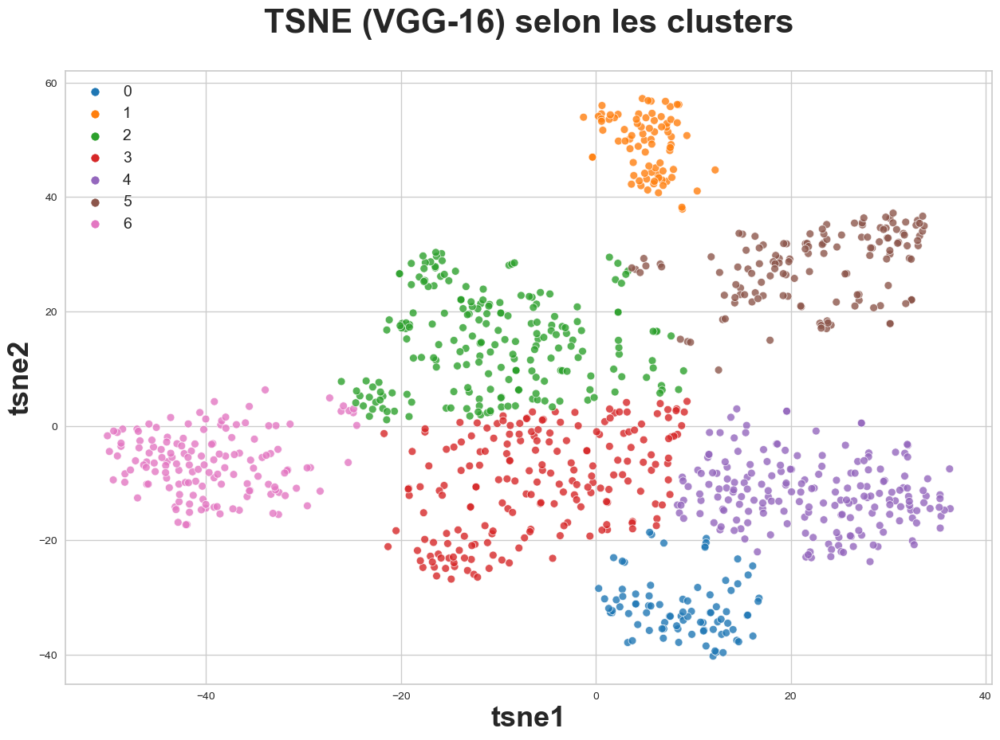

ARI :  0.5010543692140716


In [540]:
#Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters
plt.figure(figsize=(15,10))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
    data=df_tsne_vgg16,
    legend="brief")

plt.title('TSNE (VGG-16) selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

labels = df_img["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

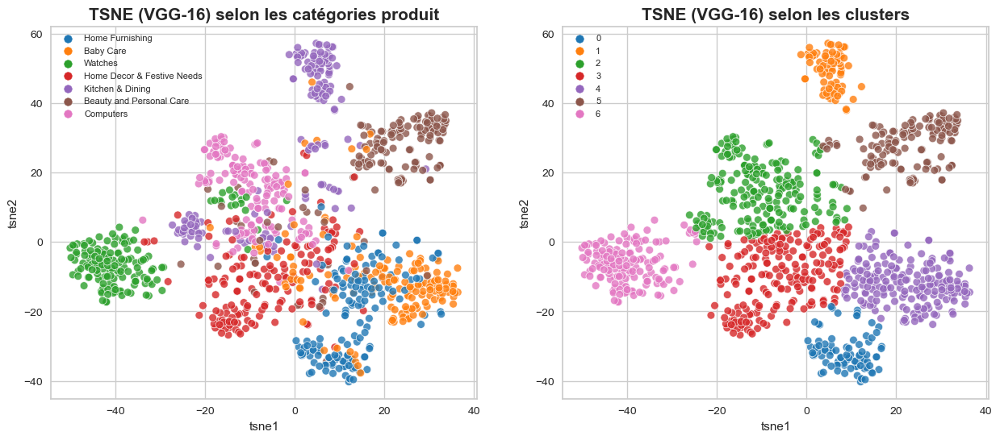

ARI :  0.5010543692140716


In [545]:
fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(121)
    

sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_vgg16, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE (VGG-16) selon les catégories produit', fontsize = 15, fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 



ax = fig.add_subplot(122)
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
    data=df_tsne_vgg16,
    legend="brief")

plt.title('TSNE (VGG-16) selon les clusters', fontsize = 15 , fontweight = 'bold')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 8}) 

plt.show()


print("===============================")
labels = df_img["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))
print("================================")

### Qualité de la catégorisation
#### répartition des vraies catégories par cluster

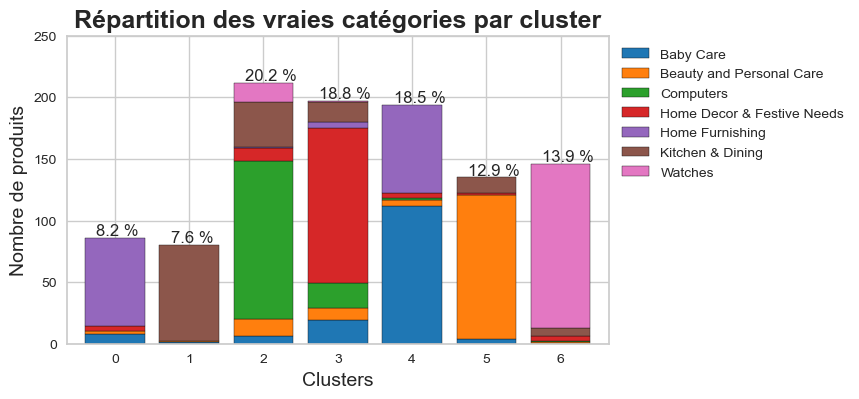

category,Baby Care,Beauty and Personal Care,Computers,Home Decor & Festive Needs,Home Furnishing,Kitchen & Dining,Watches
label,,,,,,,
0,8.0,2.0,0.0,4.0,72.0,0.0,0.0
1,1.0,1.0,0.0,0.0,0.0,78.0,0.0
2,6.0,14.0,128.0,11.0,1.0,36.0,16.0
3,19.0,10.0,20.0,126.0,5.0,16.0,1.0
4,112.0,5.0,1.0,4.0,72.0,0.0,0.0
5,4.0,117.0,0.0,1.0,0.0,13.0,0.0
6,0.0,1.0,1.0,4.0,0.0,7.0,133.0


In [542]:
plot_clust_vs_cat( df_tsne_vgg16["cluster"],
                               df_tsne_vgg16["class"],
                              df_tsne_vgg16,   
                              palette='tab10',
                              figsize=(7,4),
                              bboxtoanchor=(1,1), ylim=(0,250))

### la matrice de confusion

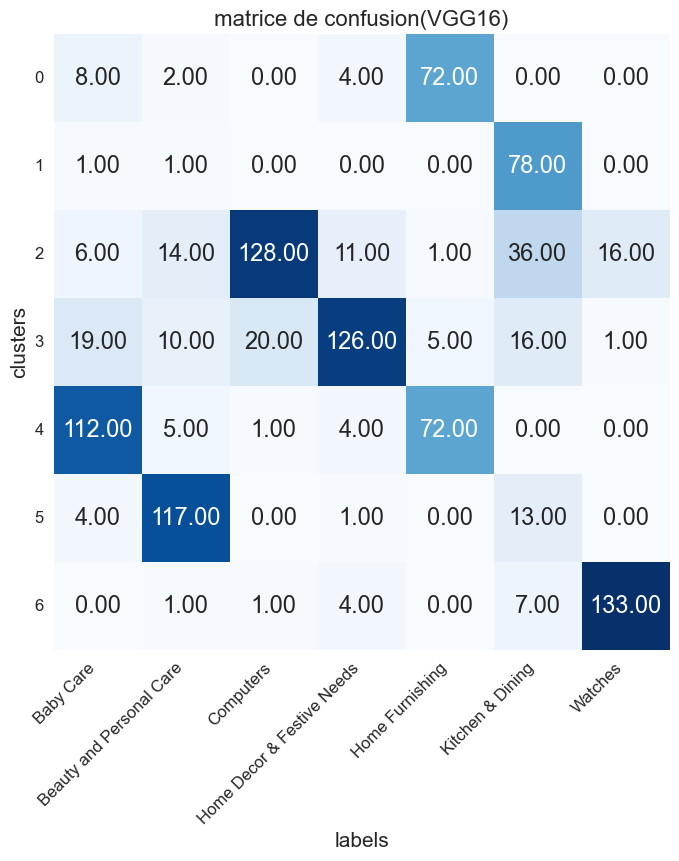

In [543]:
confusion_matrix(df_tsne_vgg16["class"], df_tsne_vgg16["cluster"], 'matrice de confusion(VGG16)')

Le VGG-16 a donné de meilleurs résultats que le SIFT

Selon les résultats du clustering, la faisabilité du moteur de classification est possible et satisfaisante avec les données textuelles, moins avec les données visuelles